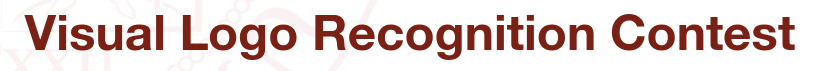

VISION AND COGNITIVE SYSTEMS A.Y. 2022/2023

The aim of the contest is to retrieve the most similar images representing logos of famous companies from a database set containing 110 images. We will consider 4 query images and use the SIFT algorithm. Model performance will be evaluated using average precision (AP) and mean average precision (mAP) metrics.
You can modify the baseline (parameters, feature matching technique, ...) and then submit your results.

- [Submit results](https://forms.gle/mNjZNVjuDuDkffBB6)
- [Visualize Submissions](https://bit.ly/3EZbYSn)

## Aim:
The aim of the contest is to try different features and characteristics.

- Check and try different parameters for the SIFT detector;

*Which kind of parameters are available for the SIFT detector?*

SIFT stands for Scale-Invariant-Feature Transform, it is an algorithm able of detecting edges and features in an image.

Here we will present all the **different parameters** that can be changed after defining a cv2.SIFT_create() object:

1. Threshold, i.e. the number of matches;
2. nfeatures; number of best features to retain;
3. nOctaveLayers: number of layers in each octave. It is computed automatically from the image resolution;
4. contrastThreshold: used to filter out weak features in semi-uniform (low contrast) regions. The larger the threshold, the less features are produced by the detector;
5. edgeThreshold: it is used to filter out edge-like features. In this case, the larger the threshold, the less features are filtered out.
6. sigma: it is the sigma of the gaussian applied to the input image at the octave #0.

- Try different local features (e.g. SURF, ORB, ...) or different combinations of detectors + descriptors

Which kind of local features can be modified?

- SURF (Speeded Up Robust Features): it is faster than SIFT and is able of handle brightness changed;
- ORB (Orientated FAST and Rotated BRIEF): alternative to SIFT and SURF, scale and rotation invariant;
- BRIEF (Binary Robust Independent Elementary Features): rapid descriptor, rotation invariant.

In [ ]:
%%capture
# Update OpenCV package

!pip install -U opencv-python
!pip install opencv-contrib-python

In [2]:
## Upload the zip folders (query.zip and database.zip)
#%%capture
#!unzip query.zip
#!unzip database.zip
#from google.colab import drive
#drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [14]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


# List of query/database images
query_images = []
db_images = []
logo_names = []

# Resize images
img_size = (400, 400)

# Read query images
# Order by name
#query_path = '/content/drive/My Drive/Logo_context/query'
query_path = './query'

query_dir = sorted(os.listdir(query_path))
for idx, img_name in enumerate(query_dir):
  # Read image
  img = cv2.imread(os.path.join(query_path, img_name))
  # Resize image
  img = cv2.resize(img, dsize=img_size)
  # Save image
  query_images.append(img)
  # Save logo names (remove "_logo.txt" and capitalize)
  logo_names.append(os.path.splitext(img_name)[0][:-5].capitalize())
  #print("Image '" + img_name + "' loaded.")
print("Query images loaded!")

# Read db images
# Order by number
#db_path = '/content/drive/My Drive/Logo_context/database'
db_path = './database'

db_dir = sorted(os.listdir(db_path), key=lambda x: int(x.split('.')[0]))
for idx, img_name in enumerate(db_dir):
  # Read image
  img = cv2.imread(os.path.join(db_path, img_name))
  # Resize image
  img = cv2.resize(img, dsize=img_size)
  # Save image
  db_images.append(img)
  #print("Image '" + img_name + "' loaded.")
print("Database images loaded!")

Query images loaded!
Database images loaded!


In [15]:
# Plot query images
fig = plt.figure(figsize=(12,12))
for i in range(len(query_images)):
  _ = plt.subplot(1, len(query_images), i+1), plt.title("Query image n. " + str(i))
  plt.imshow(cv2.cvtColor(query_images[i], cv2.COLOR_BGR2RGB)), plt.axis('off')

# Plot database images
fig = plt.figure(figsize=(12, 80))
for i in range(len(db_images)):
  _ = plt.subplot(int(len(db_images)/5), 5, i+1), plt.title("DB image n. " + str(i))
  plt.imshow(cv2.cvtColor(db_images[i], cv2.COLOR_BGR2RGB)), plt.axis('off')

In [16]:
# # Ground-truth arrays per logo
coca_cola_GT = np.zeros(len(db_images))
marlboro_GT = np.zeros(len(db_images))
starbucks_GT = np.zeros(len(db_images))
heineken_GT = np.zeros(len(db_images))

coca_cola_GT[18:25] = 1
marlboro_GT[55:61] = 1
marlboro_GT[100:] = 1
starbucks_GT[70:100] = 1
heineken_GT[25:55] = 1

# Matrix containing ground-truth values for each query image
GT_matrix = np.vstack([coca_cola_GT, heineken_GT, marlboro_GT, starbucks_GT])
print(f"GT matrix shape: {GT_matrix.shape}")

n_coca_cola = int(coca_cola_GT.sum())
n_heineken = int(heineken_GT.sum())
n_marlboro = int(marlboro_GT.sum())
n_starbucks = int(starbucks_GT.sum())
n_others = len(db_images) - (n_coca_cola + n_heineken + n_marlboro + n_starbucks)
print(f"Number of database images (coca_cola): {n_coca_cola}")
print(f"Number of database images (heineken): {n_heineken}")
print(f"Number of database images (marlboro): {n_marlboro}")
print(f"Number of database images (starbucks): {n_starbucks}")
print(f"Number of database images (others): {n_others}")
# print(GT_matrix)

GT matrix shape: (4, 110)
Number of database images (coca_cola): 7
Number of database images (heineken): 30
Number of database images (marlboro): 16
Number of database images (starbucks): 30
Number of database images (others): 27


SIFT algorithm (default parameters)

In [17]:
def get_keypoints(params = {}):
  '''
  This function can be used in order to modify the detector used to detect the keypoint, i.e edges, of images
  modifying the SIFT object
  Takes in input a dictionary with the parameters for the definition of the SIFT object
  '''
  # Define SIFT detector object
  detector = cv2.SIFT_create(**params)

  # Detect and compute interest points and their descriptors
  query_kps = []
  query_des = []
  db_kps = []
  db_des = []

  for i in range(len(query_images)):
    kp, des = detector.detectAndCompute(query_images[i], None)
    query_kps.append(kp)
    query_des.append(des)

  for i in range(len(db_images)):
    kp, des = detector.detectAndCompute(db_images[i], None)
    db_kps.append(kp)
    db_des.append(des)

  return query_kps, query_des, db_kps, db_des


In [18]:
query_kps, query_des, db_kps, db_des = get_keypoints()

Ratio test

In [19]:
def get_matches(ratio_thresh = 0.66, flag = 1):
  # Brute-force matcher
  bf = cv2.BFMatcher_create(cv2.NORM_L2)

  # Matrix containing the number of matches per logo
  num_matches = np.zeros((len(query_images), len(db_images)))

  # Filter matches using the Lowe's ratio test
  # ratio_thresh = 0.66

  # Save  matches for each descriptor of query images
  logo_matches = [] # List of lists

  # For each query image
  for q in range(len(query_images)):
    q_matches = []
    # For each database image
    for db in range(len(db_images)):
      matches = bf.knnMatch(query_des[q], db_des[db], k=2)
      # Apply ratio test
      n_matches = 0
      sel_matches = []
      for m,n in matches:
        if m.distance < ratio_thresh * n.distance:
          n_matches += 1
          sel_matches.append(m)
      # Save number of matches
      num_matches[q, db] = n_matches
      # Save matches
      q_matches.append(sel_matches)
    logo_matches.append(q_matches)

  for idx, logo in enumerate(logo_names):
    print("Number of matches (" + logo + "):")
    print(num_matches[idx])


  if flag == 1:
    return logo_matches, num_matches


In [20]:
logo_matches, num_matches = get_matches()

Number of matches (Cocacola):
[ 6.  2.  0.  4.  1.  5.  2.  3.  9.  1.  2.  1.  1.  4.  3.  0.  1.  3.
 23. 31.  8.  2.  3.  5.  7.  3.  0.  2.  4.  1.  2.  1.  4.  0.  0.  2.
  2.  3.  0.  1.  6.  2.  2.  3.  3.  8.  5.  2.  2.  1.  3.  0.  1.  2.
  4.  1.  3.  4.  3.  1.  1.  3.  4.  0.  1.  1.  3.  5.  2.  3.  2.  1.
  0.  5.  2.  0.  2.  4.  1.  0.  4.  0.  2.  0.  2.  1.  2.  0.  2.  1.
  1.  4.  6.  4.  2.  4.  1.  2.  3.  5.  0.  1.  3.  3.  1.  3.  1.  3.
  3.  7.]
Number of matches (Heineken):
[  4.   0.   1.   0.   2.   0.   2.   2.   8.   0.   1.   0.   2.   0.
   0.   1.   0.   1.   0.   2.   0.   0.   1.   0.   8.  27.  20.   1.
 117.  32.   4.  28.   0.  17.   0.  25.   1.  26.   9.  22.   6.  14.
  14.   0.   0.  50.  43.   5.  64.  26.  46.   1.   7.  52.  24.   0.
   3.   1.   8.   1.   1.   4.   8.   3.   0.   0.   0.   0.   2.   2.
   1.   0.   1.   0.   2.   0.   0.   0.   4.   1.   0.   0.   0.   0.
   1.   0.   0.   0.   1.   0.   1.   0.   0.   0.   0.   1.   0. 

In [21]:
def draw_matches(query_kps, db_kps, logo_matches):
  # Draw some matches
  _  = plt.figure(figsize=(15, 8))
  draw_params = dict(matchColor=(0, 255, 0), singlePointColor=(255, 0, 0), flags=0)
  plt_list = [25, 18, 71, 108]
  for idx, n in enumerate(plt_list):
    img_matches = cv2.drawMatches(query_images[3], query_kps[3], db_images[n], db_kps[n], logo_matches[3][n], None, **draw_params)
    _ = plt.subplot(2, 2, idx+1), plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))

  plt.show()

In [ ]:
draw_matches(query_kps, db_kps, logo_matches)

# **Performance Evaluation**

The performance of the model will be evaluated in terms of precision, recall and average precision.

In [22]:
# Average precision for each logo

def get_graphs(num_matches):
  AP_all = np.zeros(len(query_images))

  _ = plt.figure(figsize=(12, 12))
  for i in range(len(query_images)):
    # Rank images in descending order according to the number of detected matches
    idx = np.argsort(-num_matches[i])

    # True Positives
    TP = GT_matrix[i, idx] == 1

    # False Positives
    FP = GT_matrix[i, idx] == 0

    # TP and FP for each k
    TP = np.cumsum(TP)
    FP = np.cumsum(FP)

    # Precision/Recall for each k
    prec = TP / (TP + FP);
    rec = TP / np.sum(GT_matrix[i]);

    # (Interpolated) Average precision (as in Pascal VOC2008)
    AP = 0;
    interp_prec = []
    # We evaluate the precision at 11 recall values to reduce ''wiggles'' in the precision/recall curve
    for t in np.linspace(0, 1, num=11):
      p = prec[rec >= t]
      if p.size == 0:
         p = 0
      else:
         p = p.max()
      interp_prec.append(p)
      AP = AP + p/11
      AP_all[i] = AP

    # Plot precision/recall
    _ = plt.subplot(2, 2, i+1)
    plt.title(f"{logo_names[i]} - Average Precision (AP): {AP:.3f}")
    _ = plt.plot(rec, prec, '-', linewidth=3)
    _ = plt.plot(np.linspace(0, 1, num=11), interp_prec, 'o', color='red', linewidth=2)
    plt.legend(['Precision', 'Interpolated AP'])
    plt.grid('on')
    plt.xlabel('Recall'), plt.ylabel('Precision')
    plt.axis((0,1,0,1.1))
  plt.show()

  # Print results
  print('BASELINE RESULTS')
  print("Average Precision (AP):\n")
  for i in range(len(query_images)):
    print(f'{logo_names[i]:9s}  ===>' + ' ' * 2 + f'{AP_all[i]:.3f}')

  print(f"\nMean Average Precision (mAP) ===> {np.mean(AP_all):.3f}")

  return AP_all


In [ ]:
get_graphs(num_matches)

## Threshold tuning

In this section we are going to use different values for the threshold, in order to understand which is the one that can actually improve the performances of our algorithm.

In [ ]:
THRD = np.linspace(0.5, 1, num = 10) # num can be variated, it is a threshold on the rate value

all_AP = []
for i in THRD:
  print('----------------------------------------------------------------------')
  print(f'Threshold: {i:.2f}')
  logo_matches, num_matches = get_matches(ratio_thresh = i)

  AP = get_graphs(num_matches)

  all_AP.append(AP)

all_AP = np.array(all_AP)

for i in range(all_AP.shape[1]):
  plt.subplot(2, 2, i + 1)
  plt.plot(THRD, all_AP[:, i], marker = 'o', linestyle = '-')
  plt.title(f'AP for {logo_names[i]:9s}')
  plt.xlabel('Threshold rate value')
  plt.ylabel('AP')
  plt.grid()


plt.subplots_adjust(hspace = 0.5)
plt.show()


Now, let's look for which value of the threshold the maximum is reached.


In [ ]:
max_index = np.argmax(all_AP, axis = 1) # Looking for a maximum among the columns
best_thr = THRD[max_index]

print(f'Maximum is reached for threshold: {best_thr}')

# Hyperparameters tuning:

**Detection step**: in the following section we are going to tune some of the parameters regarding the SIFT algorithm, in particular during the step of detection.

In [ ]:
## It can also be interesting to actually notice if the algorithm is resistant to rotations
## These are the parameters related to detection
nOctLyrs = np.arange(1, 10)
sig = np.linspace(0.1, 5, num = 10) # to be changed
nFeat = np.arange(100, 1000) # number of features to retain

for i in range(9):
  params = {'nfeatures': nFeat[i], 'nOctaveLayers': nOctLyrs[i], 'sigma': sig[i]}
  query_kps, query_des, db_kps, db_des = get_keypoints(params)
  logo_matches, num_matches = get_matches()
  draw_matches(query_kps, db_kps, logo_matches)

# Here we should apply some kind of grid search
# The function get_params can be called inserting the different parameters




In [ ]:
import cv2
import numpy as np
from joblib import Parallel, delayed

# Feature extraction (ensure the images are valid)

sift = cv2.SIFT_create()
query_kps, query_des, db_kps, db_des = get_keypoints()

# Check if descriptors are empty
if query_des is None or db_des is None:
      print("Error: No descriptors found in the images.")
else:
        # Function to compute matches (adjusted for parallel processing)
        def get_matches(query_des, db_des, ratio_thresh=0.66):
            bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
            matches = bf.match(query_des, db_des)

            # Sort matches by distance
            matches = sorted(matches, key=lambda x: x.distance)

            # Filter matches based on the ratio threshold (if needed)
            good_matches = [match for match in matches if match.distance < ratio_thresh]

            return good_matches

        # Parallel processing of matches
        def get_matches_parallel(query_des, db_des, ratio_thresh=0.66):
            return get_matches(query_des, db_des, ratio_thresh)

        # Get matches in parallel
        num_matches = Parallel(n_jobs=2)(delayed(get_matches_parallel)(query_des, db_des) for _ in range(1))

        # Draw matches (using only the best match for simplicity)
        for i in range(len(query_des)):
          if num_matches:
            good_matches = num_matches[0]
            matched_img = cv2.drawMatches(query_des[i], query_kps[i], db_des[i], db_kps[i], good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            cv2.imshow('Matches', matched_img)
            cv2.waitKey(0)
            cv2.destroyAllWindows()
        plt.show()


# Edge detector

Another interesting point can be the one of trying to use a different edge detector. In the following we will try to implement different algorithms.

### Harris-Laplacian detector

To implement a Harris-Laplacian detector using OpenCV, a different approach is required.
The Harris-Laplacian detector typically involves two main steps:

1. Using a Harris corner detector to find keypoints;
2. Applying a Laplacian filter for scale selection.

When `cv2.cornerHarris` is applied to an image, it generates a Harris response map, that is an image where each pixel is associated to a corner strength value. Higher values indicate stronger corners, for this reason we are applying a threshold in order to find only the best cases. Only these points will be actually considered as real keypoints.
Then, the SIFT detector is used to compute descriptors for these keypoints.


In the Harris-Laplacian detector, some new parameters are encountered:

- `block_size`: defines the size of the neighborhood around each point where the algorithm calculates the gradient covariance matrix. With a larger block size value, a larger area around each pixel will be actually used to detect corners.
If it is too low, the detector will be more precise but also more affected by noise.

- `aperture_size`: size of the Kernel used to calculate the derivatives. If it is small, the detector will aknowledge details, but will be less smoothed.

- `k`: sensitivity factor. It controls the sensitivity to corners versus edges.

- `threshold`: used for computing the Harris response, it is a threshold to compute keypoints.




In [23]:
# Harris-Laplacian detector

# Detector definition

def get_keypoints_harris(params = {'blockSize' : 2, 'ksize' : 3, 'k' : 0.08}, threshold = 0.009):
  '''
  This function can be used in order to modify the detector used to detect the keypoint, i.e edges, of images
  modifying the HARRIS object
  '''
  sift = cv2.SIFT_create() # we will use the sift object only for description of the keypoints

  aperture_size = params['ksize']
  # Detect and compute interest points and their descriptors
  query_kps = []
  query_des = []
  db_kps = []
  db_des = []

  for i in range(len(query_images)):
    gray_image = cv2.cvtColor(query_images[i], cv2.COLOR_BGR2GRAY)

    # Define HARRIS detector object
    harris_corners = cv2.cornerHarris(gray_image, **params) #blockSize=block_size, ksize=aperture_size, k=k)
    harris_keypoints = np.argwhere(harris_corners > threshold * harris_corners.max())

    laplacian = cv2.Laplacian(gray_image, cv2.CV_64F)
    laplacian = np.absolute(laplacian)
    laplacian /= laplacian.max() # Laplacian normalization

    keypoints = []
    for pt in harris_keypoints:
        x, y = float(pt[1]), float(pt[0])
        # Calcola la dimensione basata sul valore del Laplaciano nel punto corrente
        laplacian_value = laplacian[int(y), int(x)]
        scale = laplacian_value * 10 + aperture_size  # Fattore di scala per amplificare il valore
        keypoints.append(cv2.KeyPoint(x=x, y=y, size=scale))

    kps, des = sift.compute(gray_image, keypoints)
    query_kps.append(kps)
    query_des.append(des)

  for i in range(len(db_images)):
    gray_image = cv2.cvtColor(db_images[i], cv2.COLOR_BGR2GRAY)

    # Define HARRIS detector object
    harris_corners = cv2.cornerHarris(gray_image, **params)
    harris_keypoints = np.argwhere(harris_corners > threshold * harris_corners.max())

    laplacian = cv2.Laplacian(gray_image, cv2.CV_64F)
    laplacian = np.absolute(laplacian)
    laplacian /= laplacian.max() # Laplacian normalization

    keypoints = []
    for pt in harris_keypoints:
        x, y = float(pt[1]), float(pt[0])
        # Calcola la dimensione basata sul valore del Laplaciano nel punto corrente
        laplacian_value = laplacian[int(y), int(x)]
        scale = laplacian_value * 10 + aperture_size  # Fattore di scala per amplificare il valore
        keypoints.append(cv2.KeyPoint(x=x, y=y, size=scale))

    kps, des = sift.compute(gray_image, keypoints)
    db_kps.append(kps)
    db_des.append(des)

  return query_kps, query_des, db_kps, db_des

Number of matches (Cocacola):
[0. 0. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  2.  1.  2. 56.  1.  0.  0.  0.  0.  0.  0.
  0.  2.  0.  8.  0.  0.  0.  0.  0. 37. 16.  0.  5.  1. 14.  0.  0.  0.
  6.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  1.
  0.  0.  0.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.]
Number of matches (Marlboro):
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0

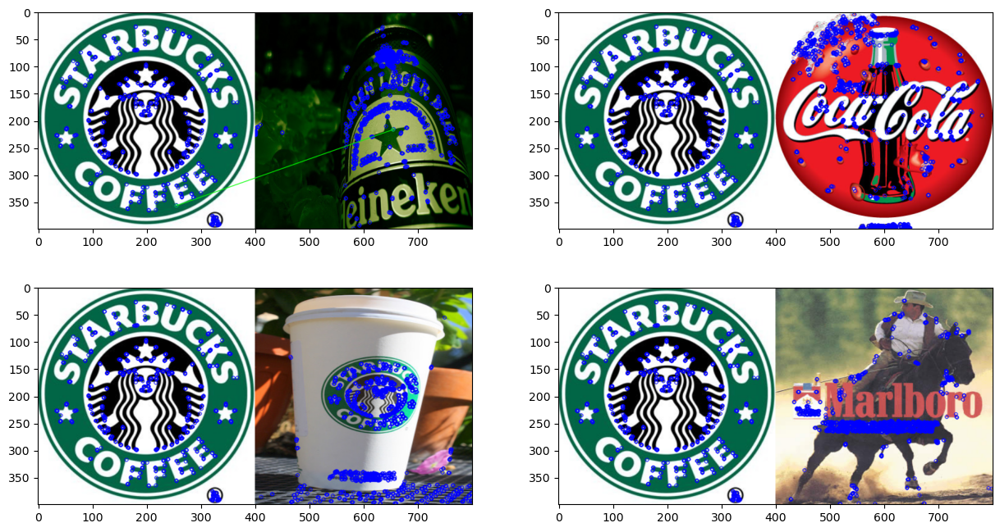

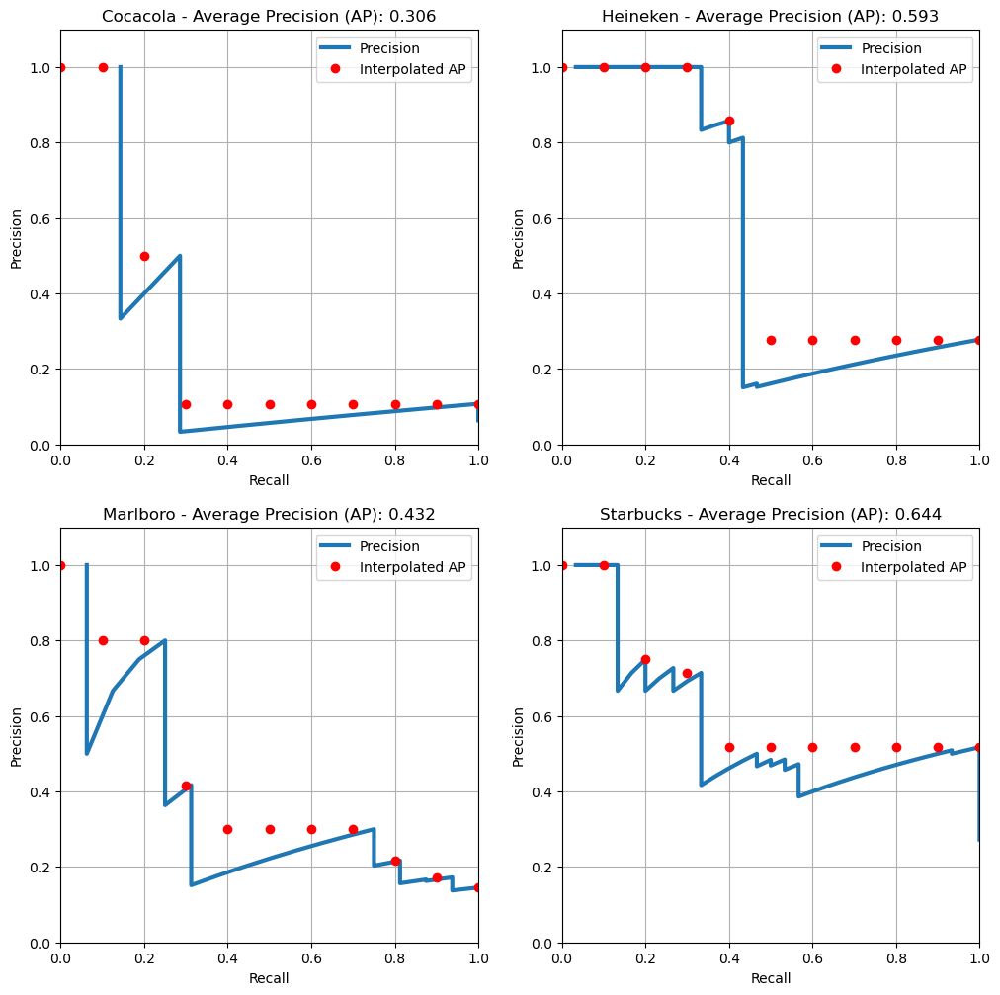

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.306
Heineken   ===>  0.593
Marlboro   ===>  0.432
Starbucks  ===>  0.644

Mean Average Precision (mAP) ===> 0.494


array([0.30559441, 0.59307359, 0.43192742, 0.64408867])

In [25]:
query_kps, query_des, db_kps, db_des = get_keypoints_harris()
logo_matches, num_matches = get_matches()
draw_matches(query_kps, db_kps, logo_matches)
get_graphs(num_matches)

As it is possible to observe, some parameters tuning is needed also in this case.

Number of matches (Cocacola):
[ 1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 11.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.]
Number of matches (Heineken):
[ 2.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  1.  0.  1.  0.  0.  0.  0.  2.  1.  0. 99.  0.  0.  0.  0.  0.  0.  0.
  1.  2.  0.  9.  0.  0.  0.  0.  0. 63. 35.  0.  6.  3. 36.  0.  0.  0.
  9.  0.  0.  0.  2.  0.  1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  1.  1.
  0.  0.  0.  1.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.]
Number of matches (Marlboro):
[ 0.  0.  3.  

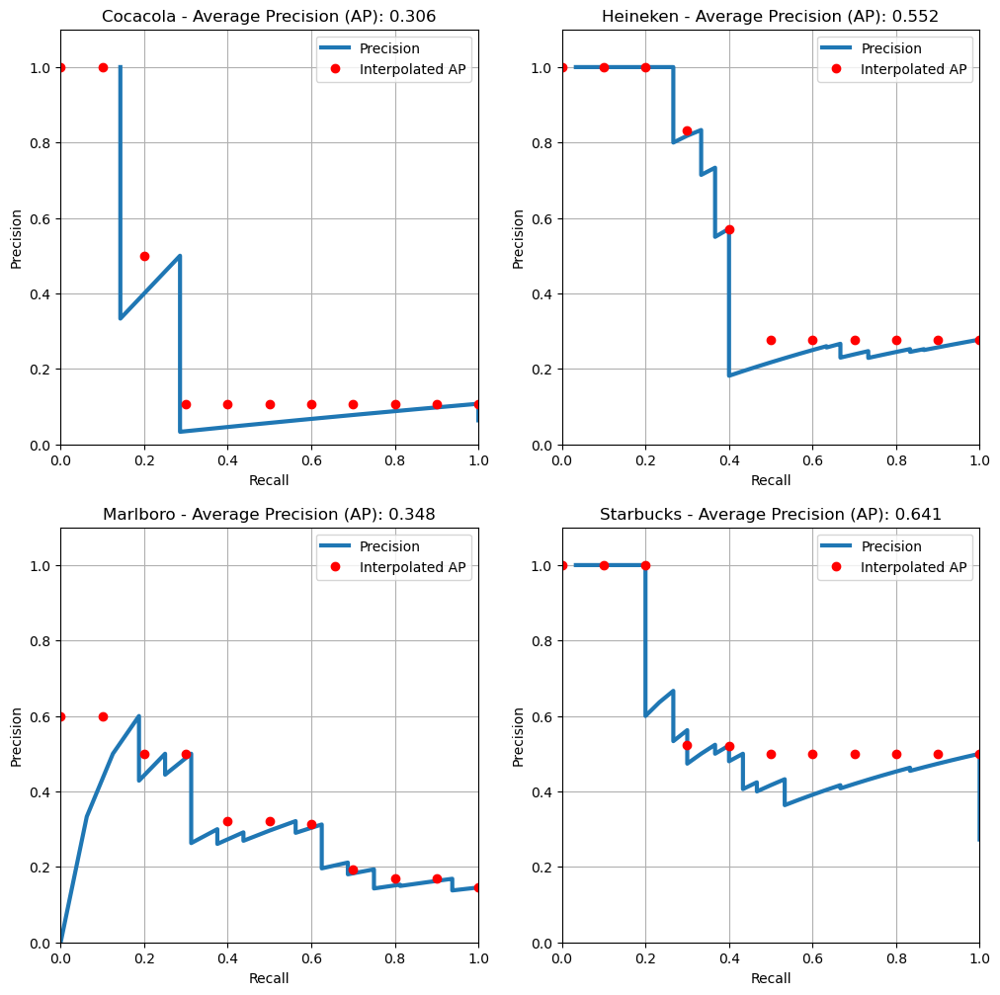

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.306
Heineken   ===>  0.552
Marlboro   ===>  0.348
Starbucks  ===>  0.641

Mean Average Precision (mAP) ===> 0.462
[0.30559441 0.55194805 0.34831261 0.64050442]
Number of matches (Cocacola):
[ 0.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
 10.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  1.  0.  0.  0.  0.  0.  0.  3.  2.  2. 78.  3.  0.  0.  0.  0.  0.  0.
  1.  3.  0.  7.  0.  0.  0.  0.  0. 52. 22.  0.  3.  0. 27.  0.  0.  0.
  7.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.

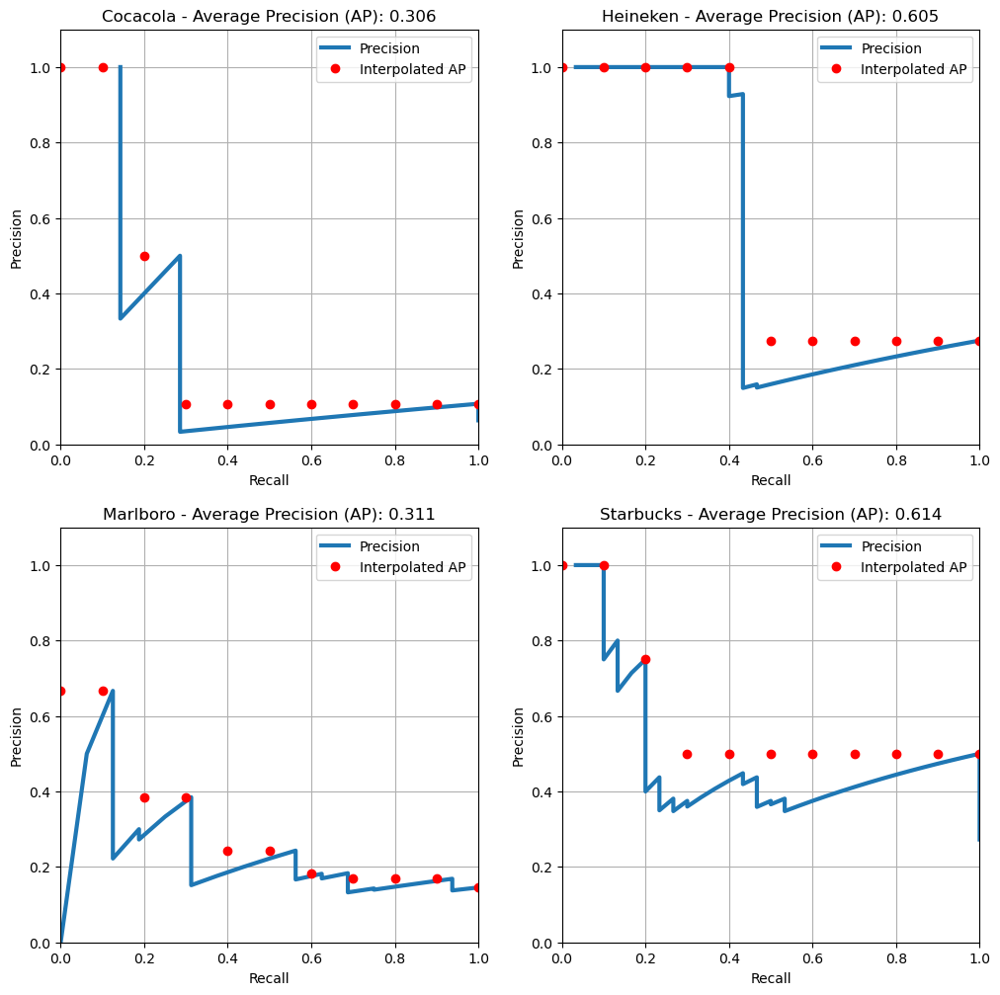

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.306
Heineken   ===>  0.605
Marlboro   ===>  0.311
Starbucks  ===>  0.614

Mean Average Precision (mAP) ===> 0.459
[0.30559441 0.60467056 0.31122331 0.61363636]
Number of matches (Cocacola):
[0. 0. 0. 0. 3. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  1.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  5.  0.  2. 62.  1.  0.  0.  0.  1.  0.  0.
  0.  2.  0.  6.  0.  0.  0.  0.  0. 42. 20.  0.  3.  0. 21.  0.  0.  0.
  8.  0.  0.  0.  1.  0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  1.
  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

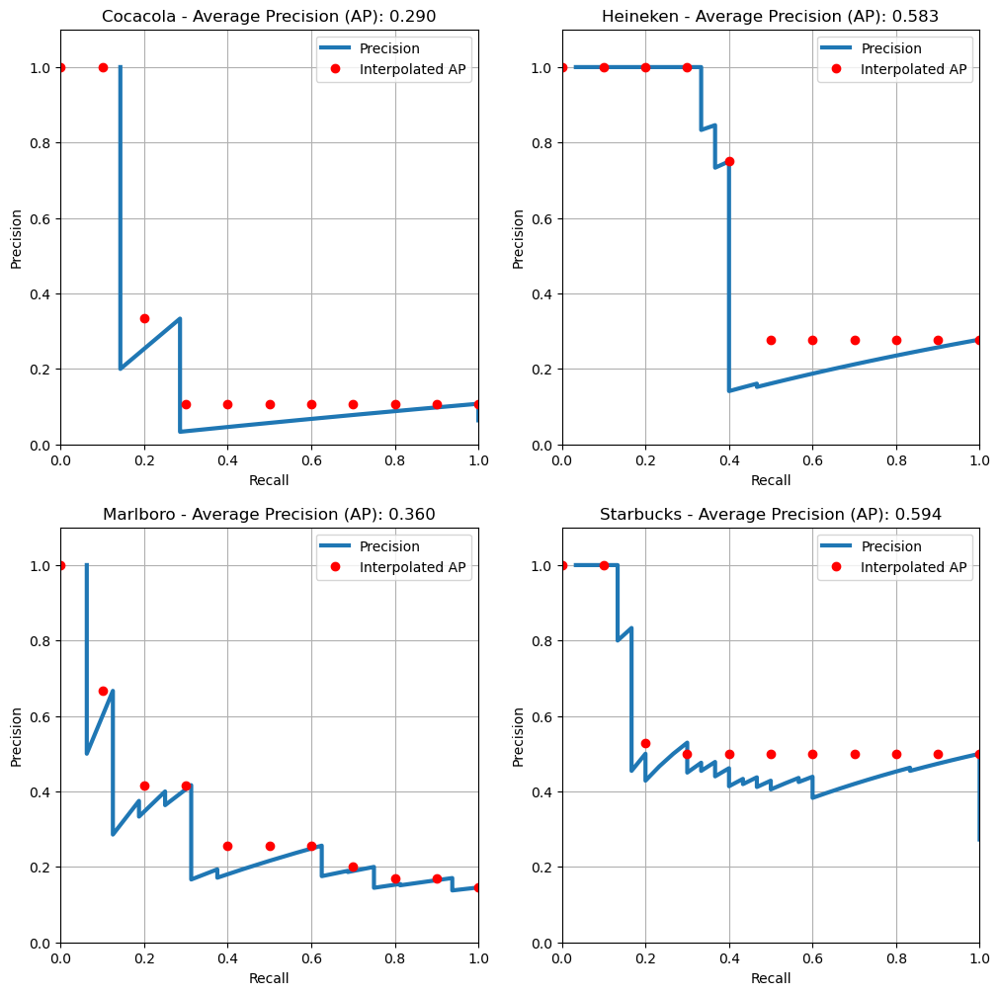

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.290
Heineken   ===>  0.583
Marlboro   ===>  0.360
Starbucks  ===>  0.594

Mean Average Precision (mAP) ===> 0.457
[0.29044289 0.58333333 0.35959949 0.59358289]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 41.  0.  0.  0.  0.  0.  0.  0.
  0.  1.  0.  0.  0.  0.  0.  0.  0. 42. 12.  0.  0.  6. 50.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

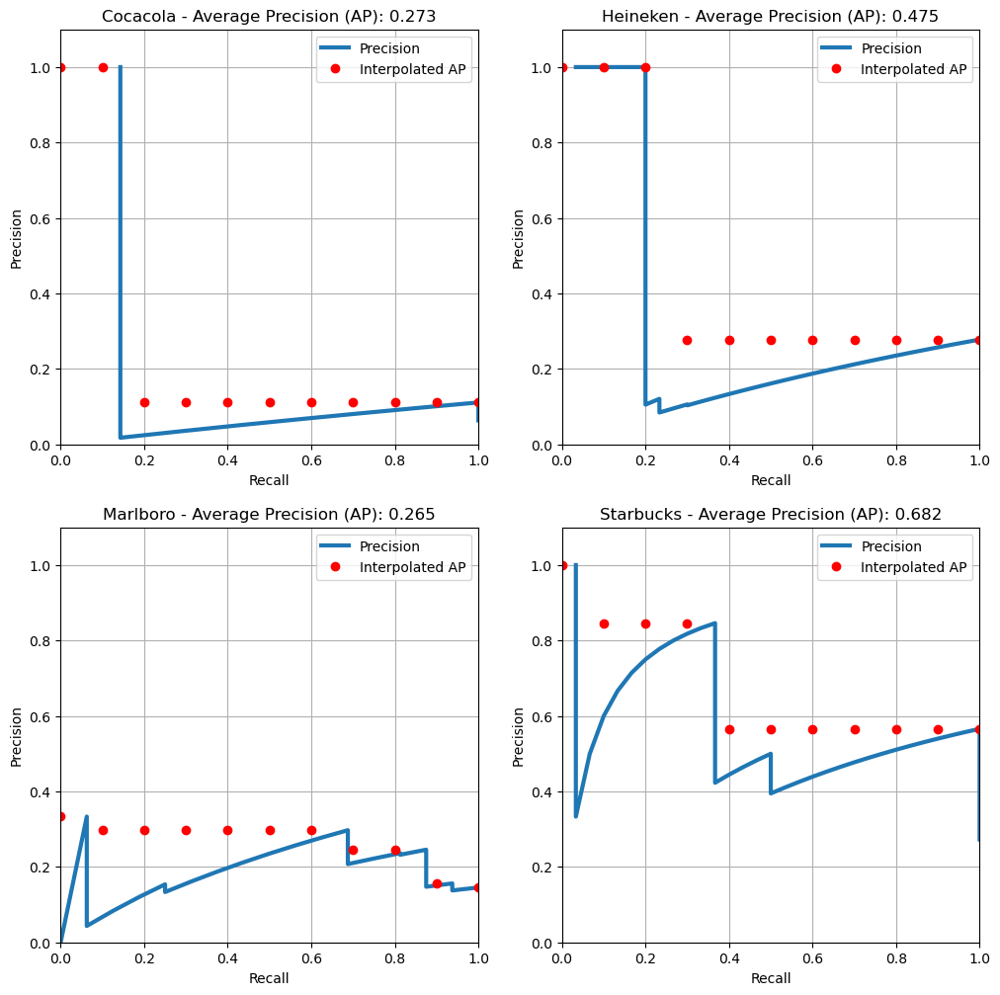

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.475
Marlboro   ===>  0.265
Starbucks  ===>  0.682

Mean Average Precision (mAP) ===> 0.423
[0.27272727 0.47474747 0.26454998 0.68188415]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 25.  0.  0.  0.  0.  0.  0.  0.
  0.  1.  0.  4.  0.  0.  0.  0.  0. 42.  6.  0.  0.  0. 36.  0.  0.  0.
  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

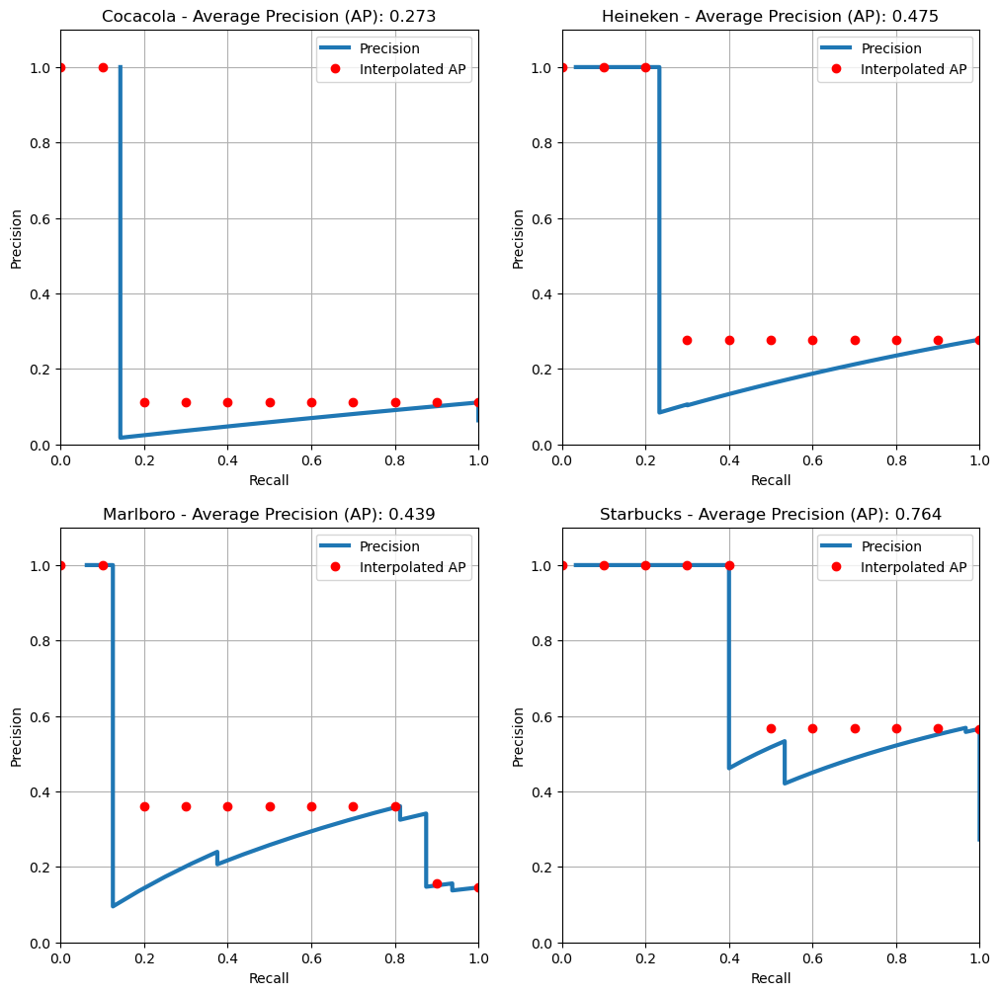

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.475
Marlboro   ===>  0.439
Starbucks  ===>  0.764

Mean Average Precision (mAP) ===> 0.488
[0.27272727 0.47474747 0.43904385 0.76447045]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 27.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  1.  0.  0.  0.  0.  0. 42. 19.  0.  2.  0. 23.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

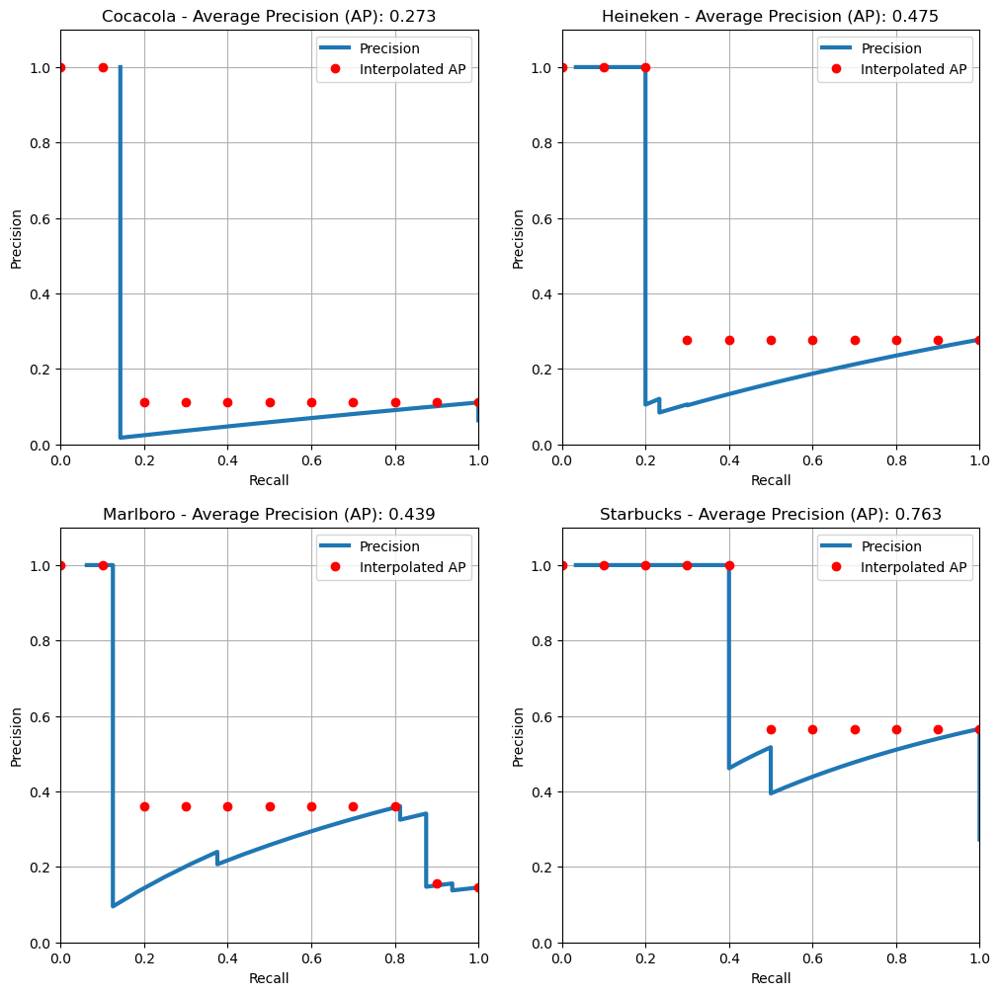

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.475
Marlboro   ===>  0.439
Starbucks  ===>  0.763

Mean Average Precision (mAP) ===> 0.487
[0.27272727 0.47474747 0.43904385 0.76329331]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 23.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 13.  7.  0.  0.  0. 29.  0.  0.  0.
  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

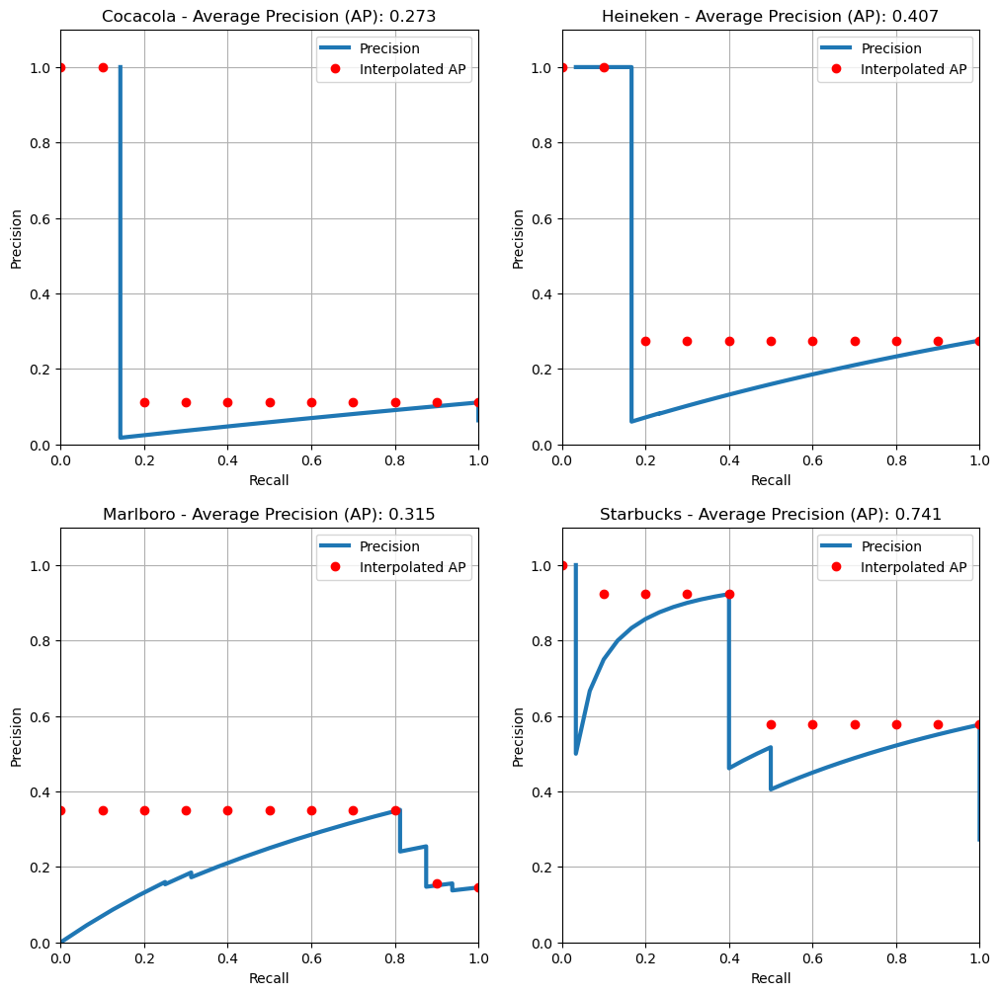

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.315
Starbucks  ===>  0.741

Mean Average Precision (mAP) ===> 0.434
[0.27272727 0.40700584 0.31489697 0.74125874]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 10.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 20.  8.  0.  0.  0. 14.  0.  0.  0.
  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

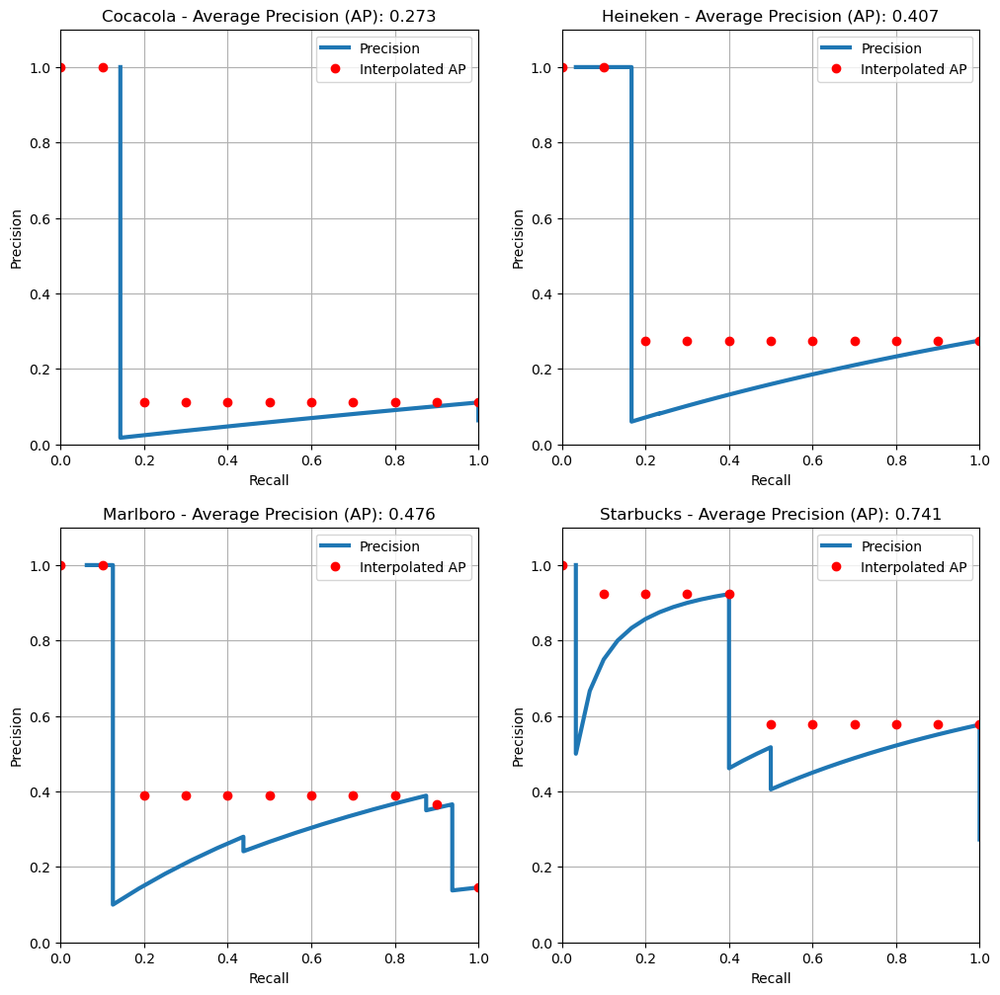

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.476
Starbucks  ===>  0.741

Mean Average Precision (mAP) ===> 0.474
[0.27272727 0.40700584 0.47577549 0.74125874]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 21.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 22. 12.  0.  0.  0.  5.  0.  0.  0.
  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

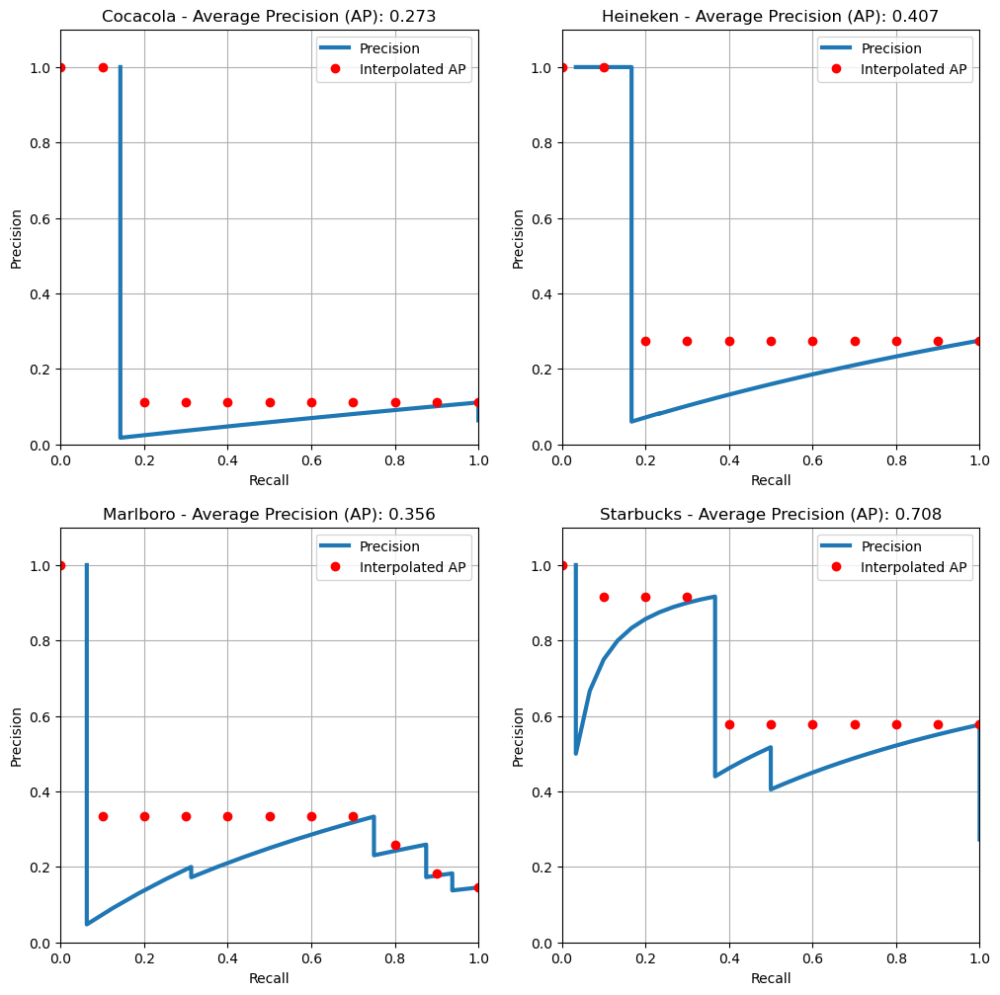

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.356
Starbucks  ===>  0.708

Mean Average Precision (mAP) ===> 0.436
[0.27272727 0.40700584 0.35645218 0.70804196]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 8. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[  0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   3.   1.   0.
 136.   6.   0.   0.   0.   0.   0.   0.   0.   1.   0.  13.   0.   0.
   0.   0.   0. 117.  41.   0.   2.   0.  56.   0.   0.   0.  13.   0.
   0.   0.   5.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   

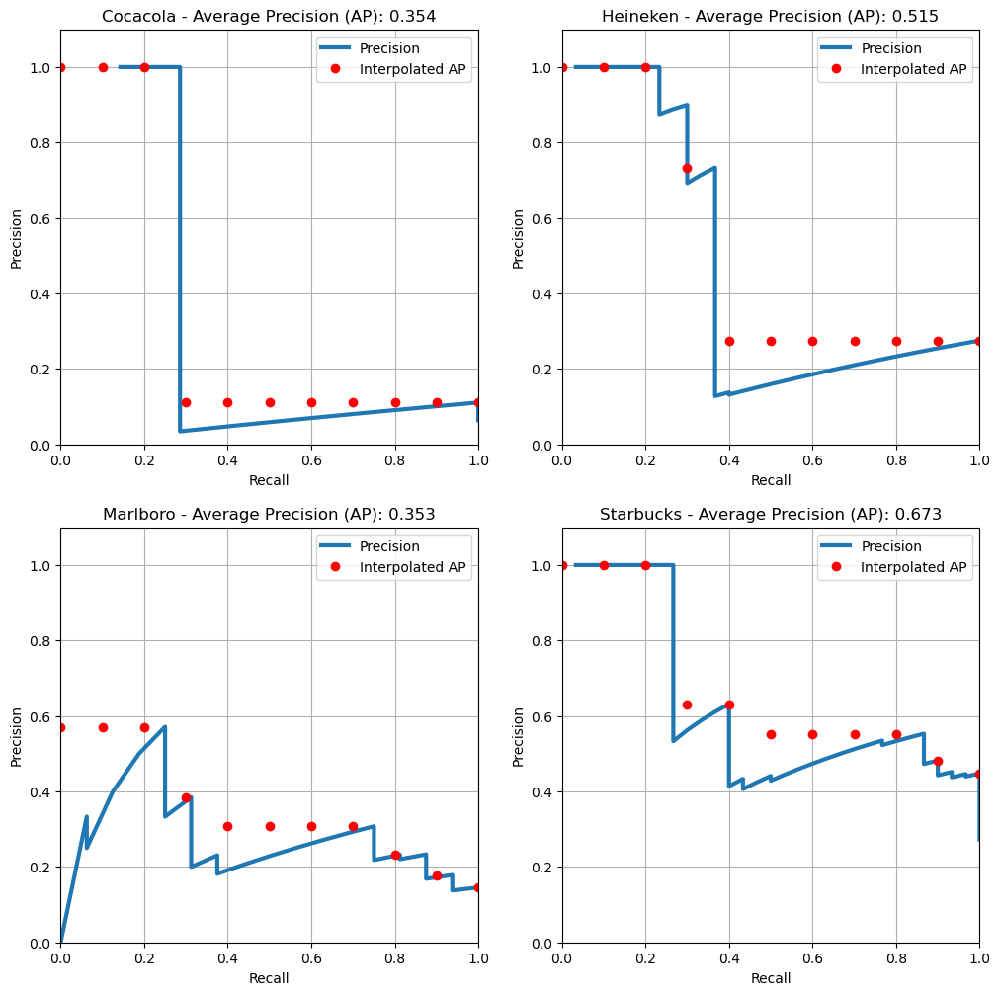

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.354
Heineken   ===>  0.515
Marlboro   ===>  0.353
Starbucks  ===>  0.673

Mean Average Precision (mAP) ===> 0.474
[0.35353535 0.51453989 0.35336633 0.67325708]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[  0.   0.   0.   0.   2.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   3.   1.   0.
 115.   2.   0.   0.   0.   0.   0.   0.   0.   5.   0.  14.   0.   0.
   0.   0.   0.  95.  32.   0.   5.   5.  55.   0.   0.   0.   6.   0.
   0.   0.   4.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.
   0.   1.   0.   0.   0.   

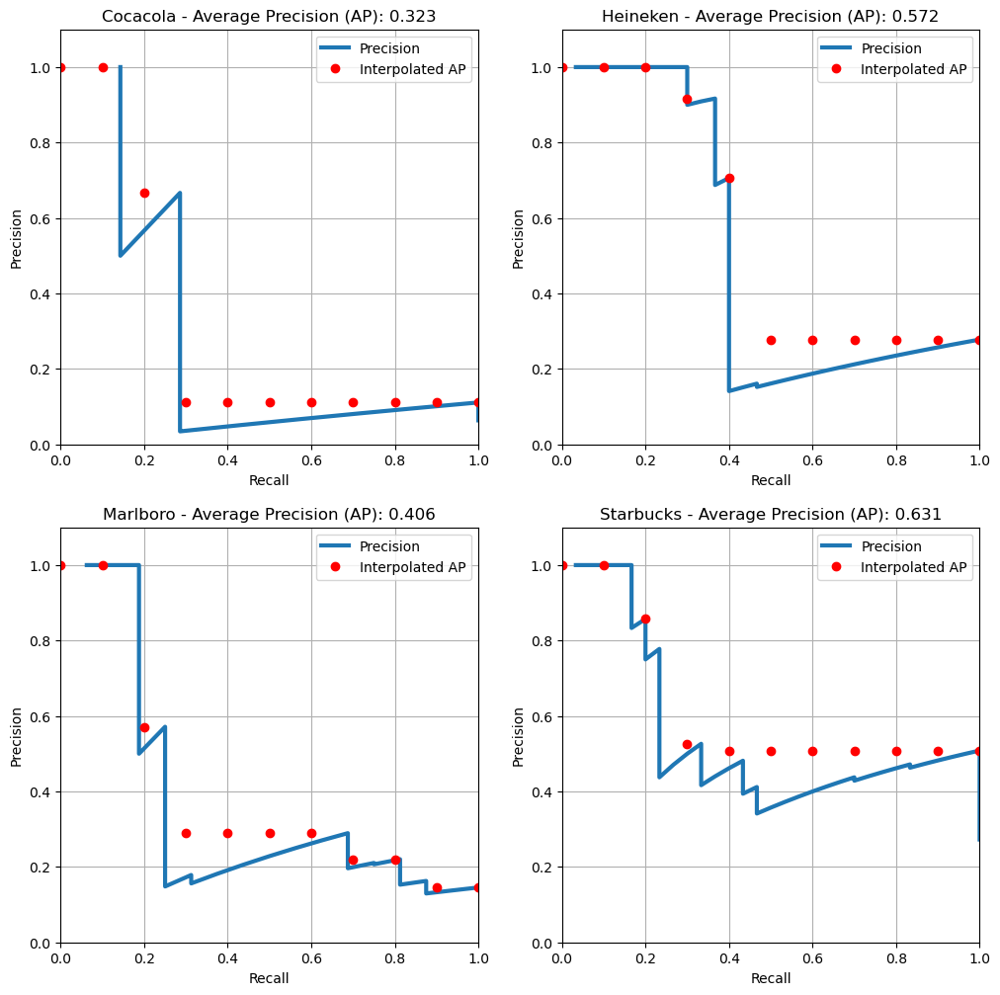

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.323
Heineken   ===>  0.572
Marlboro   ===>  0.406
Starbucks  ===>  0.631

Mean Average Precision (mAP) ===> 0.483
[0.32323232 0.57174688 0.40553731 0.63116188]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 1.  0.  1.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  4.  1.  0. 88.  2.  0.  0.  0.  0.  0.  0.
  0.  4.  0. 12.  0.  0.  0.  0.  0. 85. 44.  0.  5.  4. 41.  0.  0.  0.
  4.  5.  0.  0.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

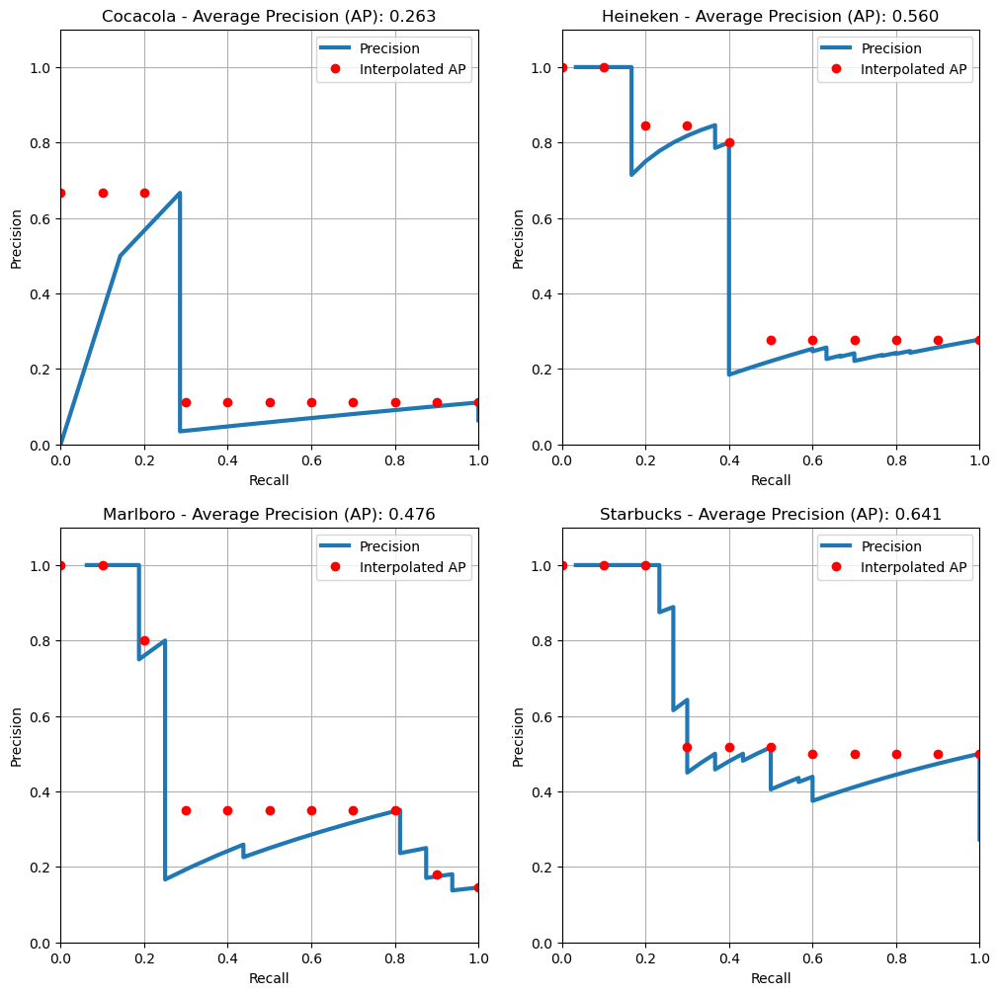

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.263
Heineken   ===>  0.560
Marlboro   ===>  0.476
Starbucks  ===>  0.641

Mean Average Precision (mAP) ===> 0.485
[0.26262626 0.55990676 0.47584414 0.64106583]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  3.  0.  0. 62.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 63. 11.  0.  0.  0. 61.  0.  0.  0.
  1.  0.  0.  0.  0.  0.  0.  2.  0.  0.  5.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

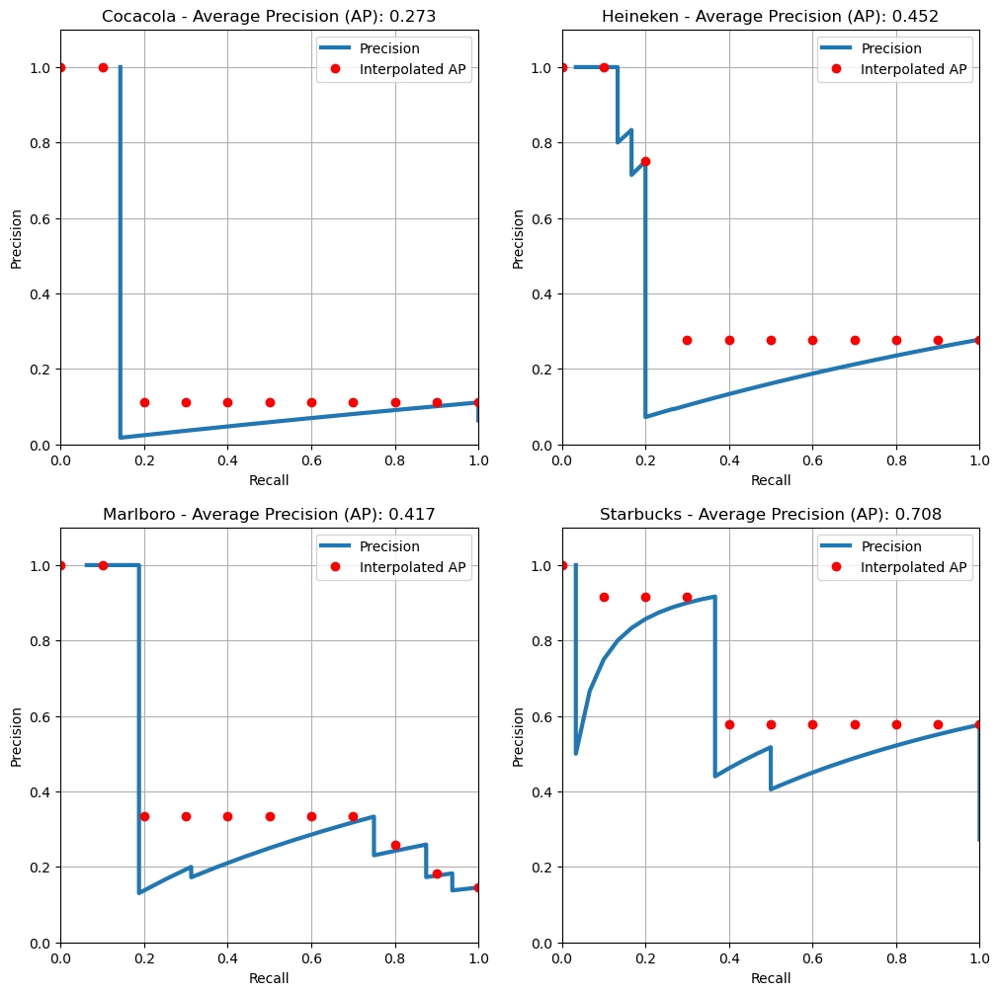

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.452
Marlboro   ===>  0.417
Starbucks  ===>  0.708

Mean Average Precision (mAP) ===> 0.462
[0.27272727 0.4520202  0.41705824 0.70804196]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 50.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 43. 14.  0.  0.  0. 43.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

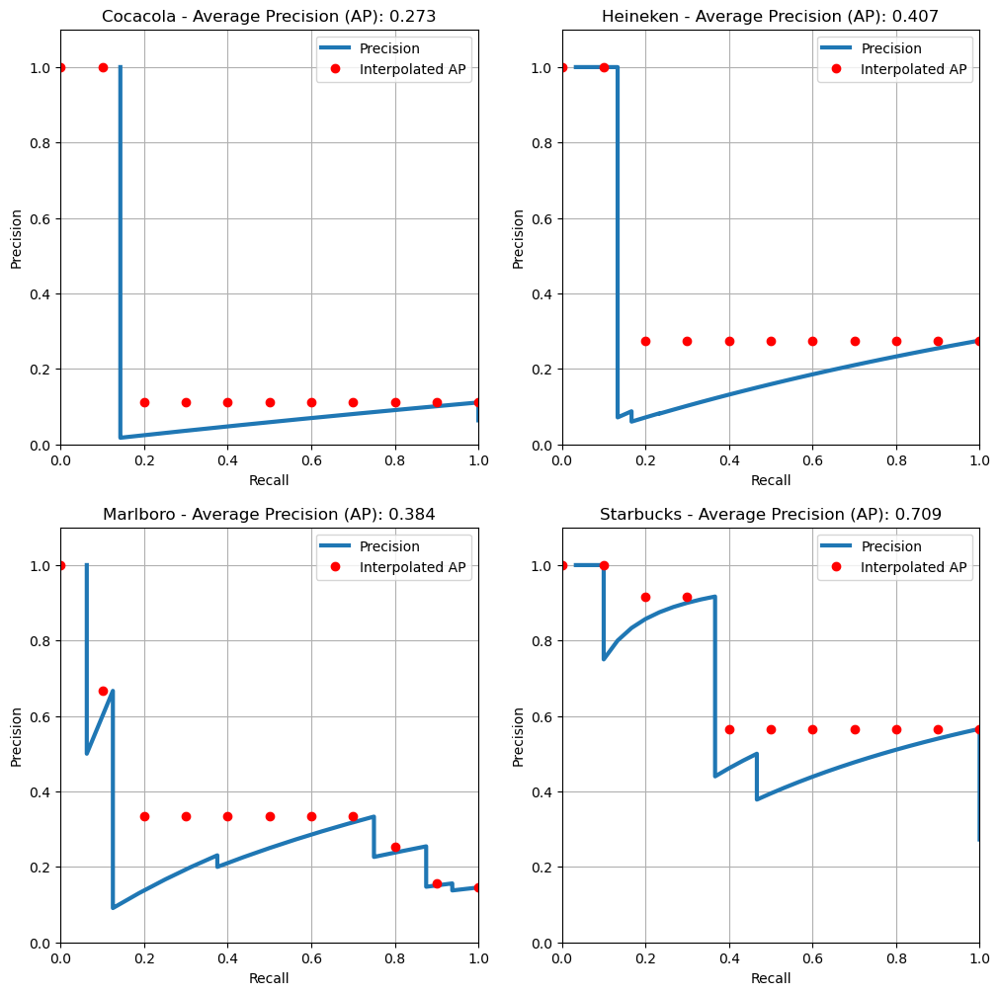

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.384
Starbucks  ===>  0.709

Mean Average Precision (mAP) ===> 0.443
[0.27272727 0.40700584 0.38390152 0.70869068]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  2.  0.  0. 46.  0.  0.  0.  0.  0.  0.  0.
  0.  2.  0.  2.  0.  0.  0.  0.  0. 42. 14.  0.  0.  0. 42.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

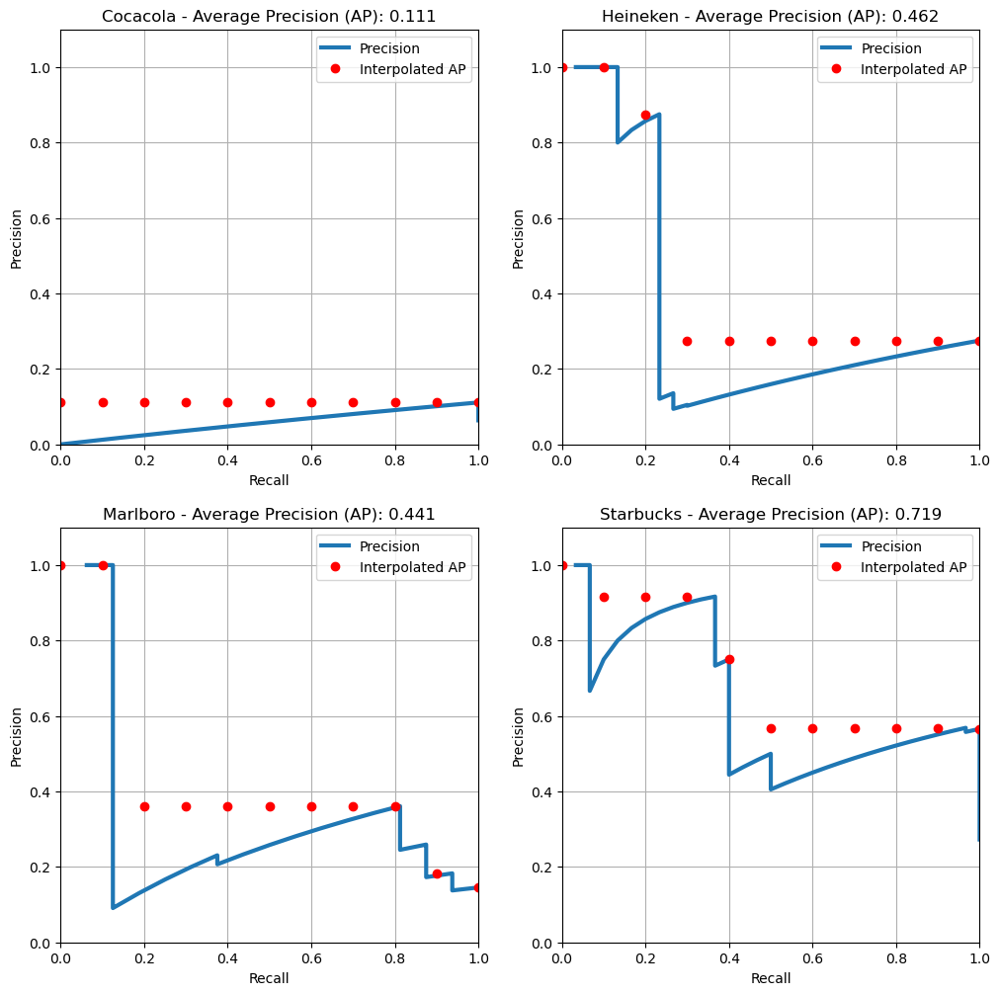

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.111
Heineken   ===>  0.462
Marlboro   ===>  0.441
Starbucks  ===>  0.719

Mean Average Precision (mAP) ===> 0.433
[0.11111111 0.46153044 0.44146901 0.71901591]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 15.  0.  0.  0.  0.  0.  0.  0.
  0.  1.  0.  0.  0.  0.  0.  0.  0. 14.  7.  0.  0.  0. 51.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

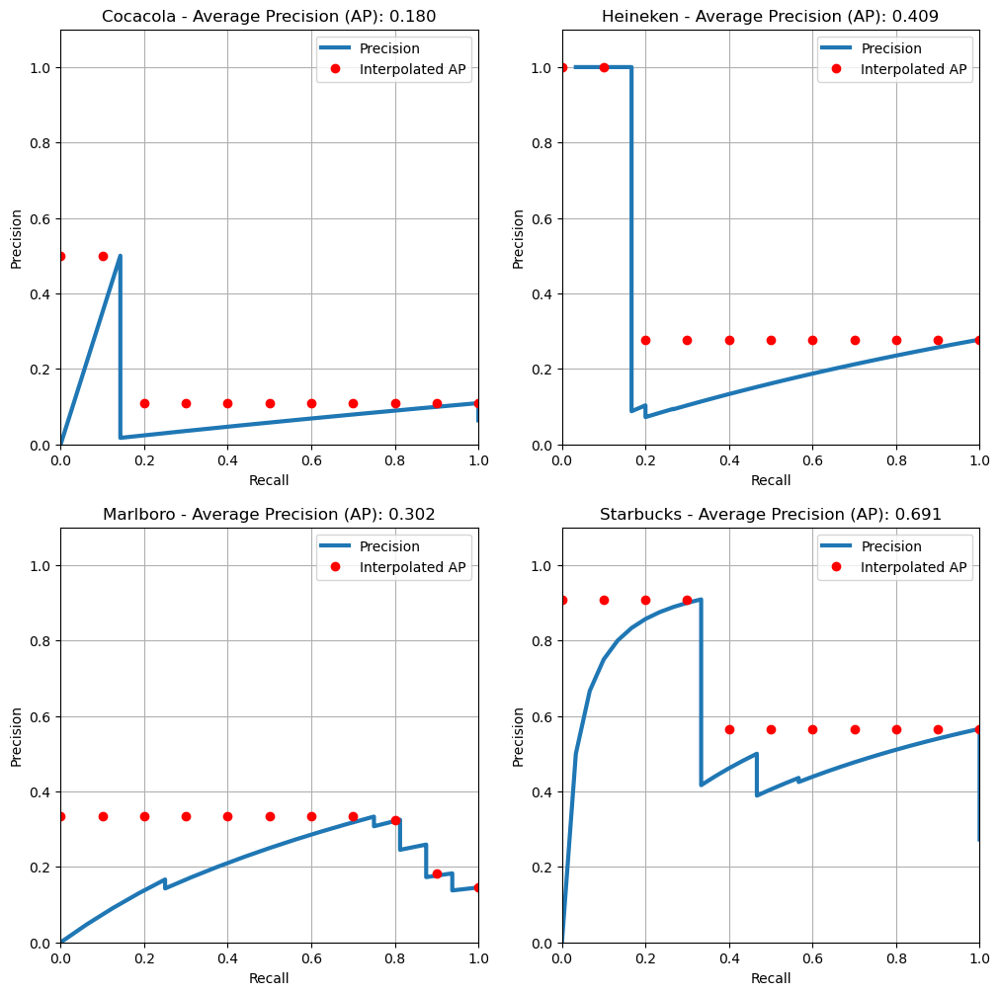

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.180
Heineken   ===>  0.409
Marlboro   ===>  0.302
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.396
[0.18039773 0.40909091 0.30182255 0.69078434]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 28.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.  8.  0.  0.  0. 39.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

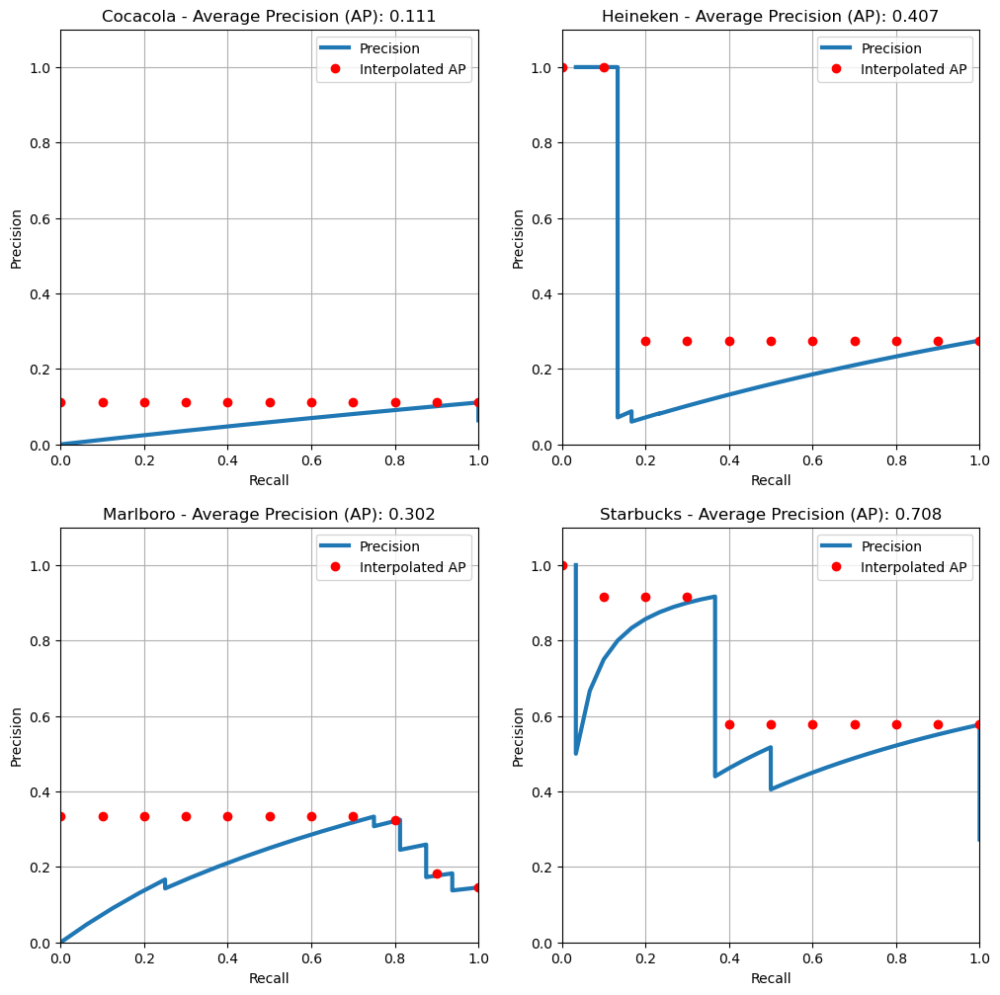

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.111
Heineken   ===>  0.407
Marlboro   ===>  0.302
Starbucks  ===>  0.708

Mean Average Precision (mAP) ===> 0.382
[0.11111111 0.40700584 0.30182255 0.70804196]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 11.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.  8.  0.  0.  0. 31.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

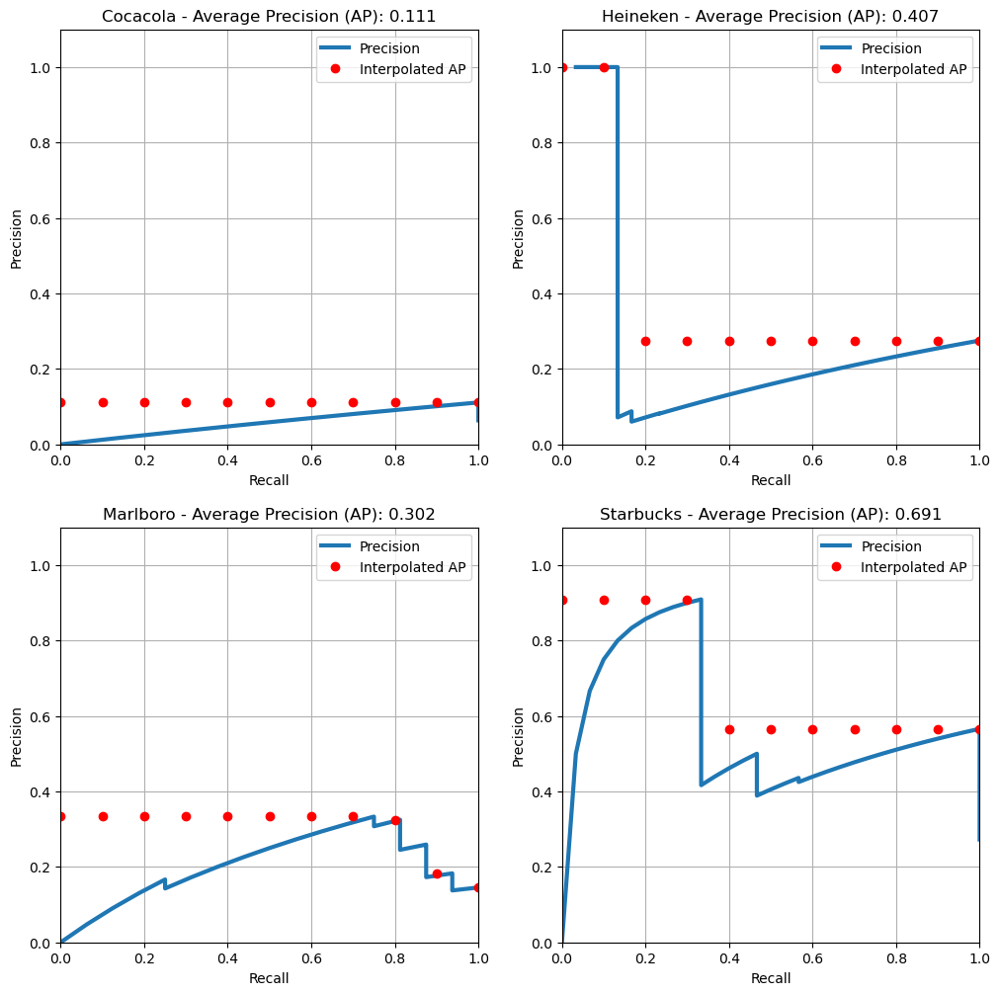

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.111
Heineken   ===>  0.407
Marlboro   ===>  0.302
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.378
[0.11111111 0.40700584 0.30182255 0.69078434]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[  2.   0.   0.   0.   2.   1.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   0.   0.   1.   0.
 164.   3.   0.   0.   0.   0.   0.   1.   0.   1.   0.  12.   0.   0.
   0.   0.   0. 175.  45.   0.   1.   0.  69.   0.   0.   1.  10.   0.
   0.   0.   5.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   

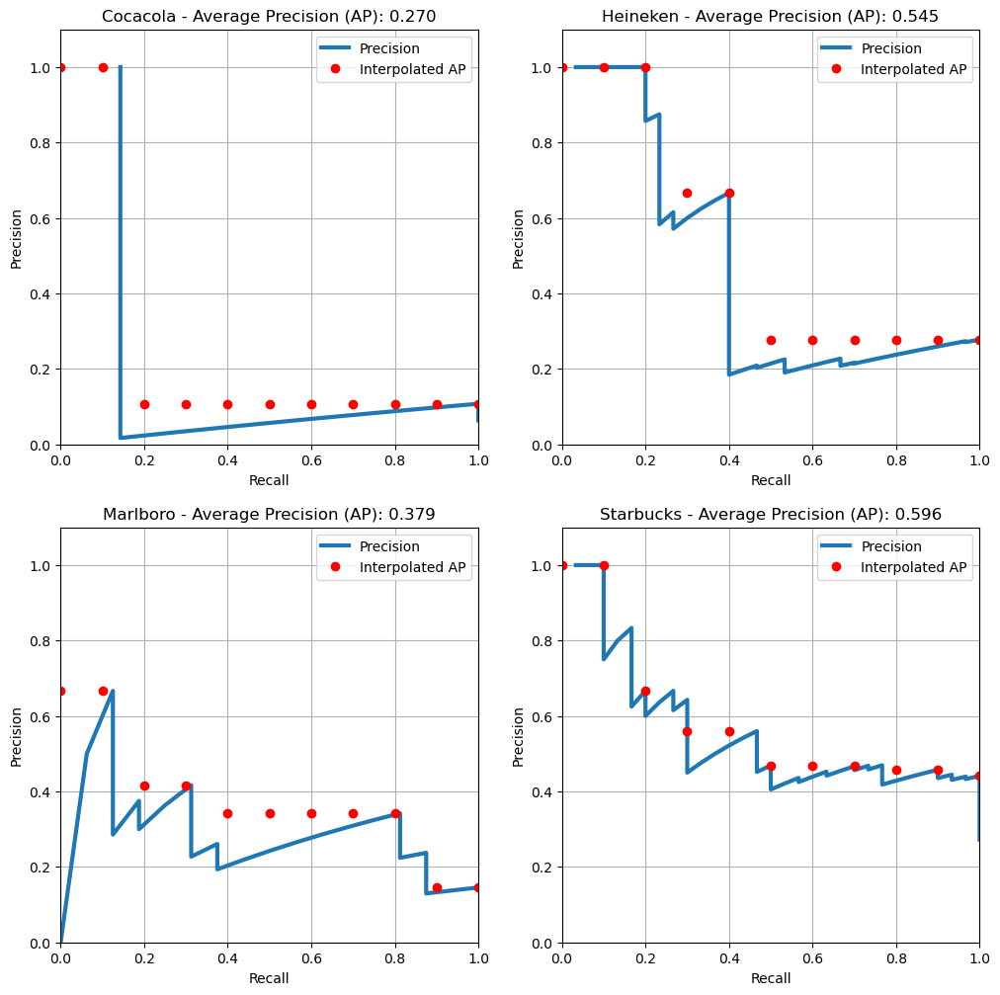

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.270
Heineken   ===>  0.545
Marlboro   ===>  0.379
Starbucks  ===>  0.596

Mean Average Precision (mAP) ===> 0.447
[0.26993007 0.54545455 0.37891837 0.59556915]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0.
 2. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[  0.   0.   0.   0.   2.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   2.   0.
 155.   0.   0.   0.   0.   0.   0.   0.   0.   9.   0.  11.   0.   0.
   0.   0.   0. 134.  34.   0.   1.   1.  58.   0.   0.   0.  11.   0.
   0.   0.   5.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   

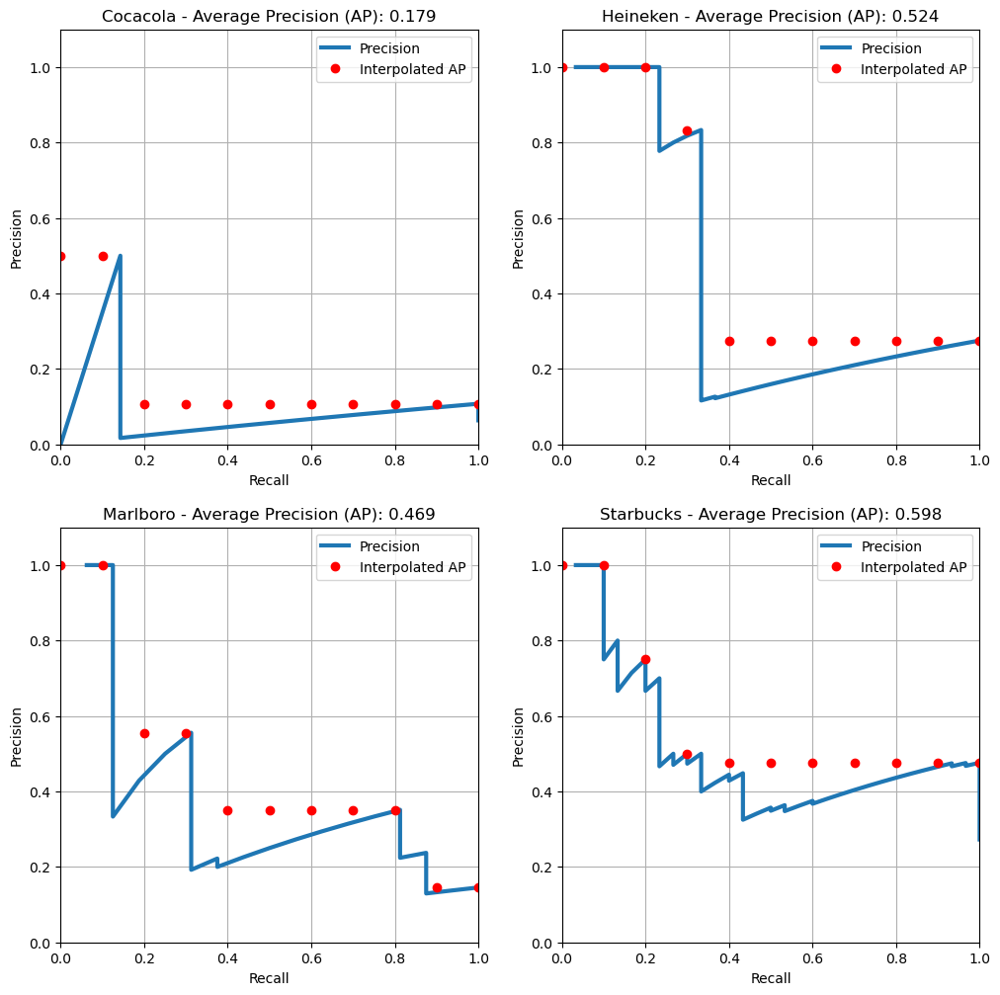

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.179
Heineken   ===>  0.524
Marlboro   ===>  0.469
Starbucks  ===>  0.598

Mean Average Precision (mAP) ===> 0.443
[0.17902098 0.5236308  0.46897972 0.59848485]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 5. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[  0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   4.   1.   0.
 131.   3.   0.   0.   0.   0.   0.   0.   0.   8.   0.   4.   0.   0.
   0.   0.   0. 113.  38.   0.   2.   3.  51.   0.   0.   0.   4.   0.
   0.   0.   5.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   1.   0.   0.   0.   

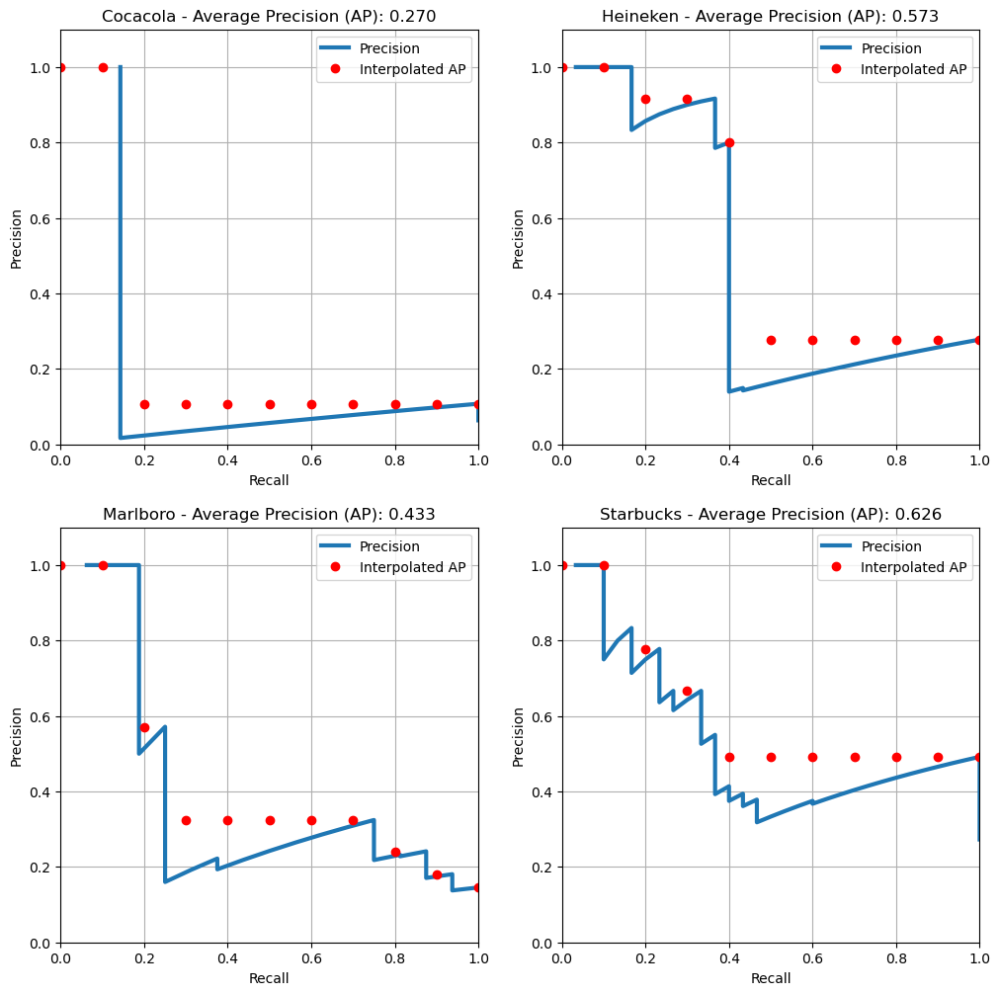

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.270
Heineken   ===>  0.573
Marlboro   ===>  0.433
Starbucks  ===>  0.626

Mean Average Precision (mAP) ===> 0.475
[0.26993007 0.57272727 0.43278245 0.62609704]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 5. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 61.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  1.  0.  0.  0.  0.  0. 71. 11.  0.  0.  0. 72.  0.  0.  0.
 14.  0.  0.  0.  2.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

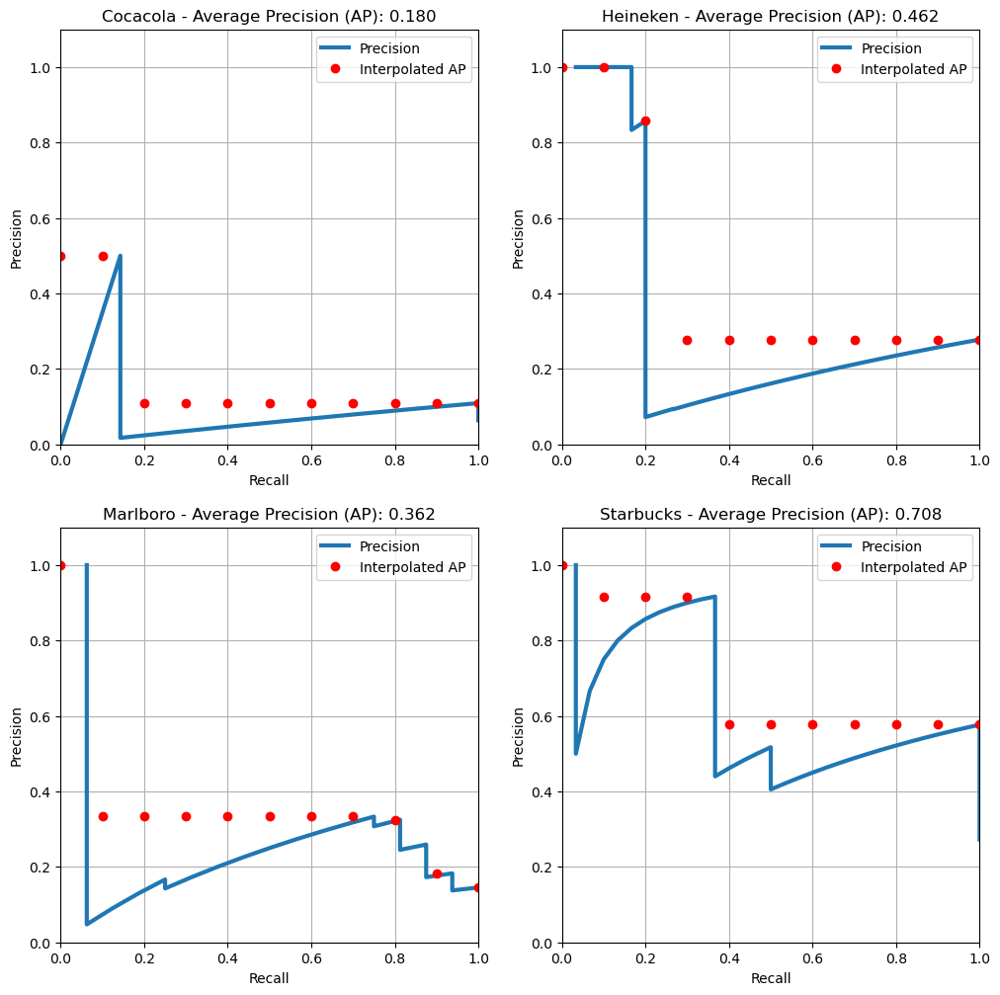

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.180
Heineken   ===>  0.462
Marlboro   ===>  0.362
Starbucks  ===>  0.708

Mean Average Precision (mAP) ===> 0.428
[0.18039773 0.46176046 0.36242861 0.70804196]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 48.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 59.  6.  0.  0.  0. 51.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 16.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

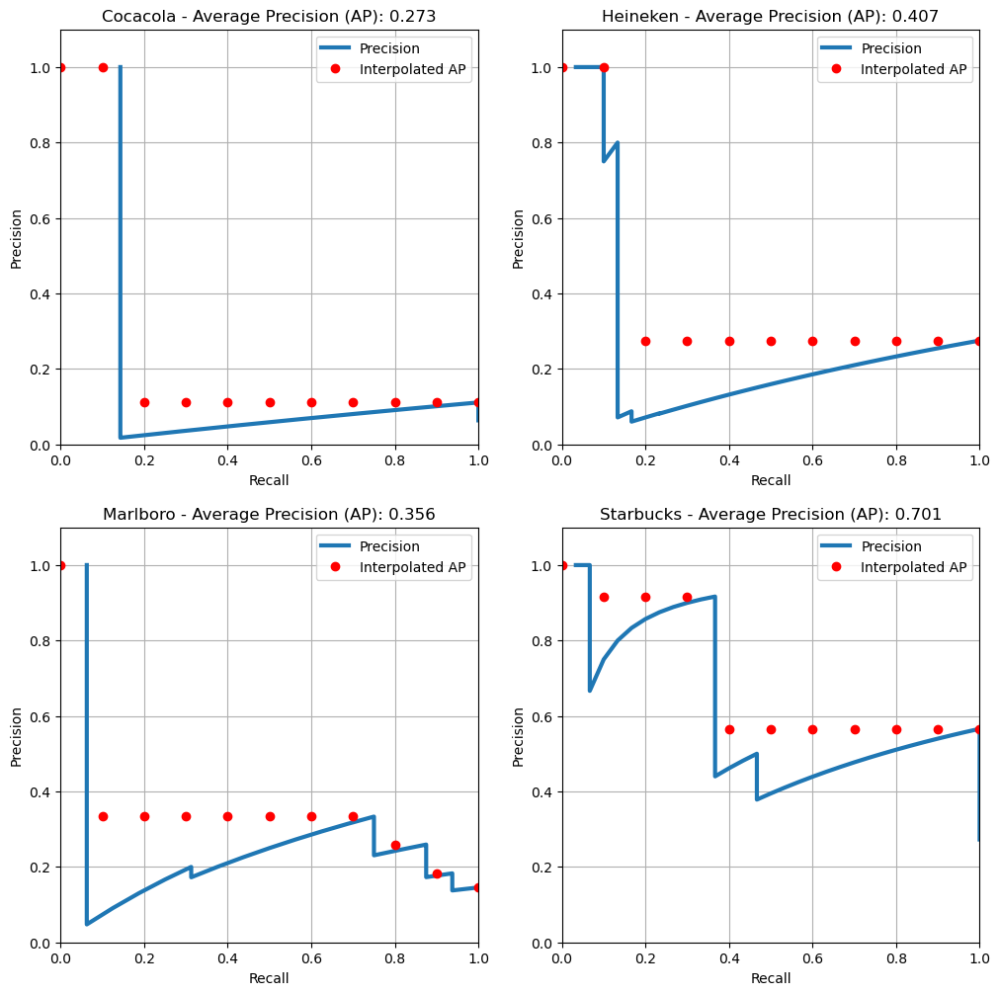

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.356
Starbucks  ===>  0.701

Mean Average Precision (mAP) ===> 0.434
[0.27272727 0.40700584 0.35645218 0.70111492]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 9. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  2.  0.  0. 38.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  1.  0.  0.  0.  0.  0. 48.  8.  0.  0.  0. 56.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

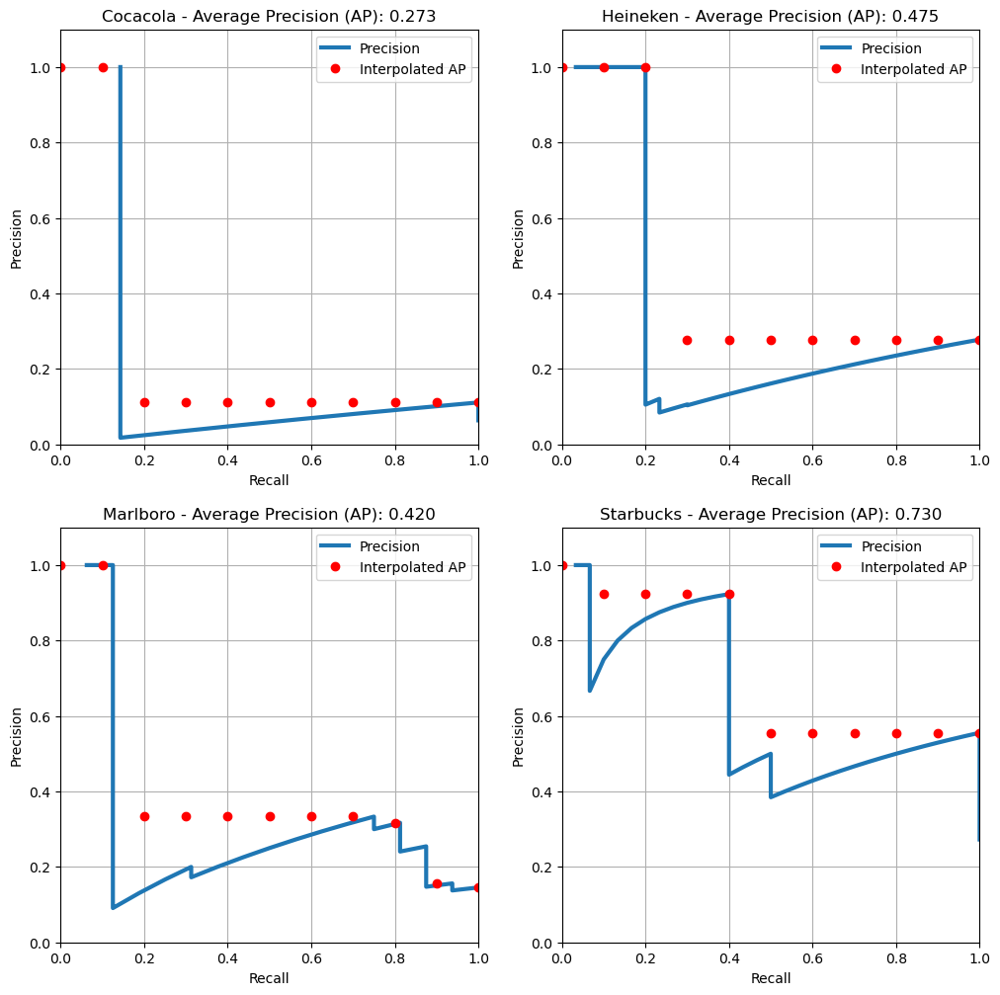

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.475
Marlboro   ===>  0.420
Starbucks  ===>  0.730

Mean Average Precision (mAP) ===> 0.474
[0.27272727 0.47474747 0.41988888 0.72960373]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 18.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 12.  1.  0.  0.  0. 60.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

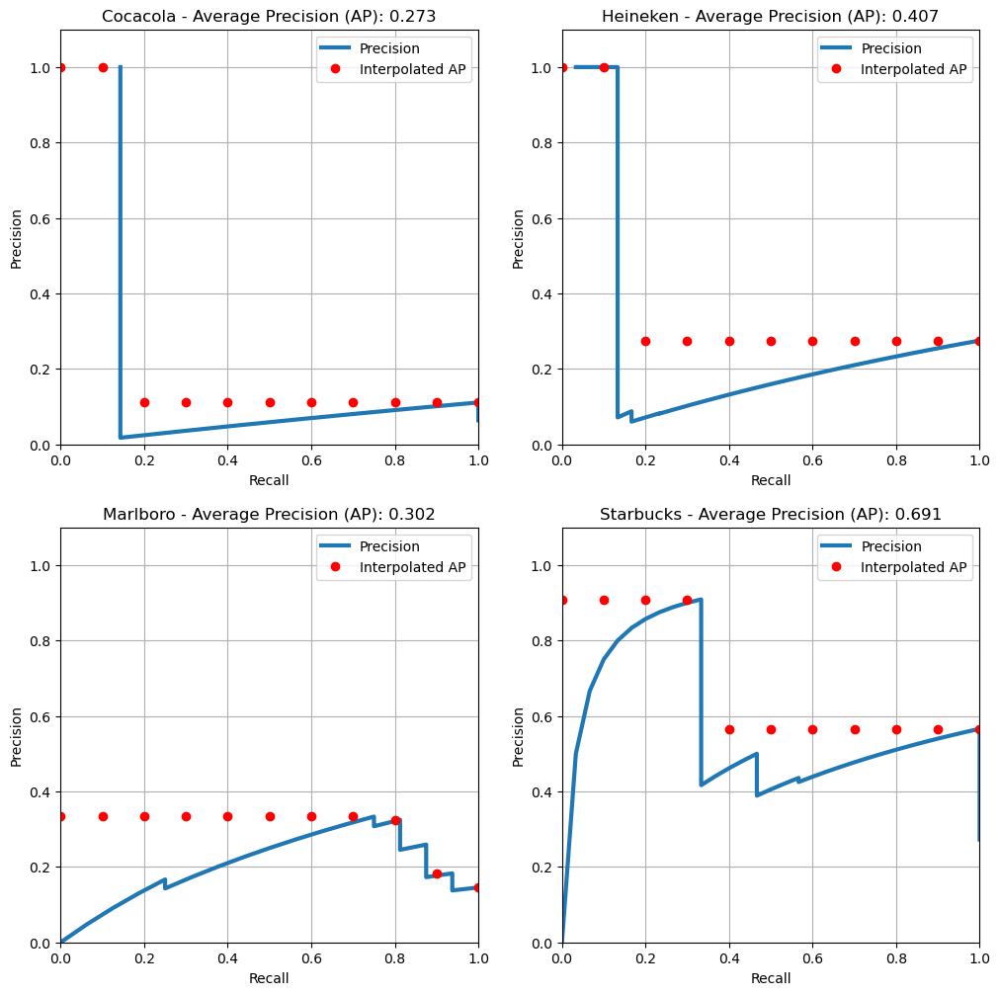

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.302
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.418
[0.27272727 0.40700584 0.30182255 0.69078434]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 14.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.  0.  0.  0.  0. 50.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

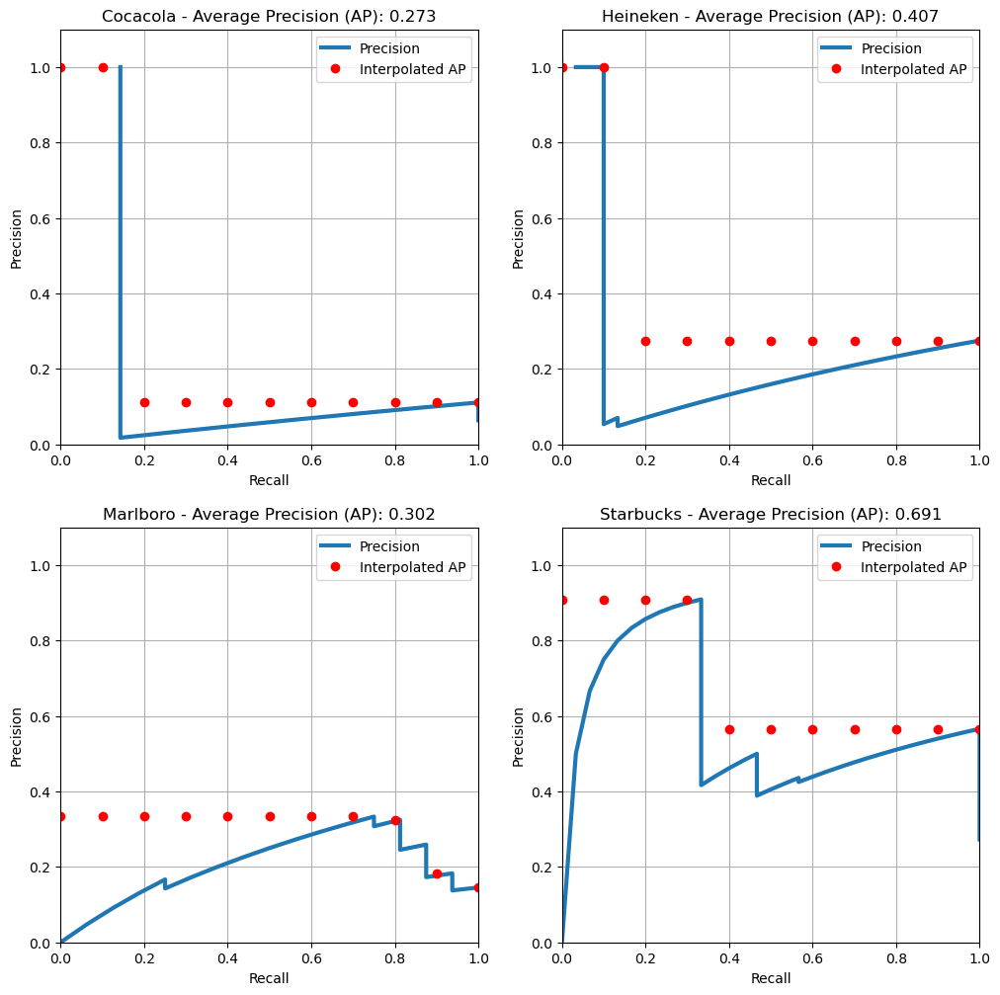

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.302
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.418
[0.27272727 0.40700584 0.30182255 0.69078434]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 19.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 17.  4.  0.  0.  0. 49.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

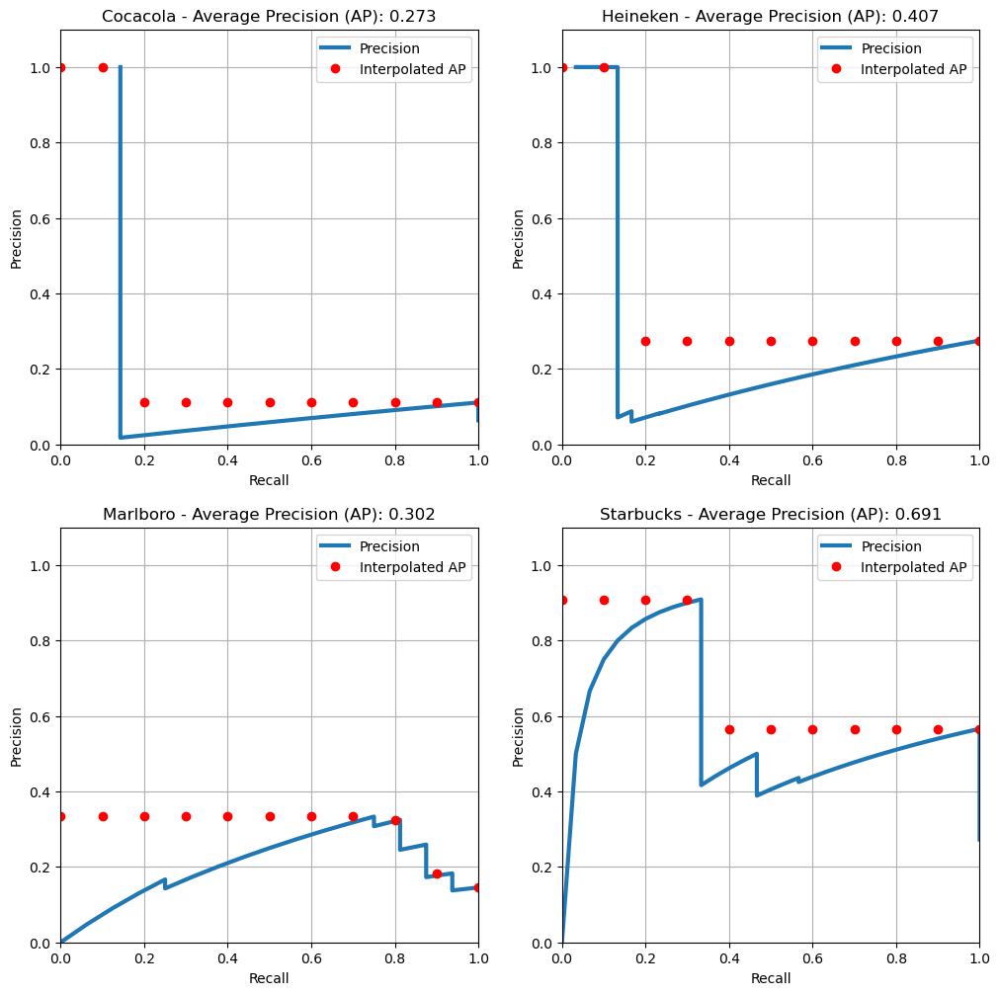

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.302
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.418
[0.27272727 0.40700584 0.30182255 0.69078434]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[  0.   0.   0.   0.   1.   0.   0.   1.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   0.   0.
 170.   3.   0.   0.   0.   1.   0.   1.   0.   2.   0.   5.   0.   0.
   0.   0.   0. 260.  47.   0.   1.   1.  84.   0.   0.   0.  14.   1.
   0.   0.   8.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   3.
   0.   0.   0.   0.   0.   

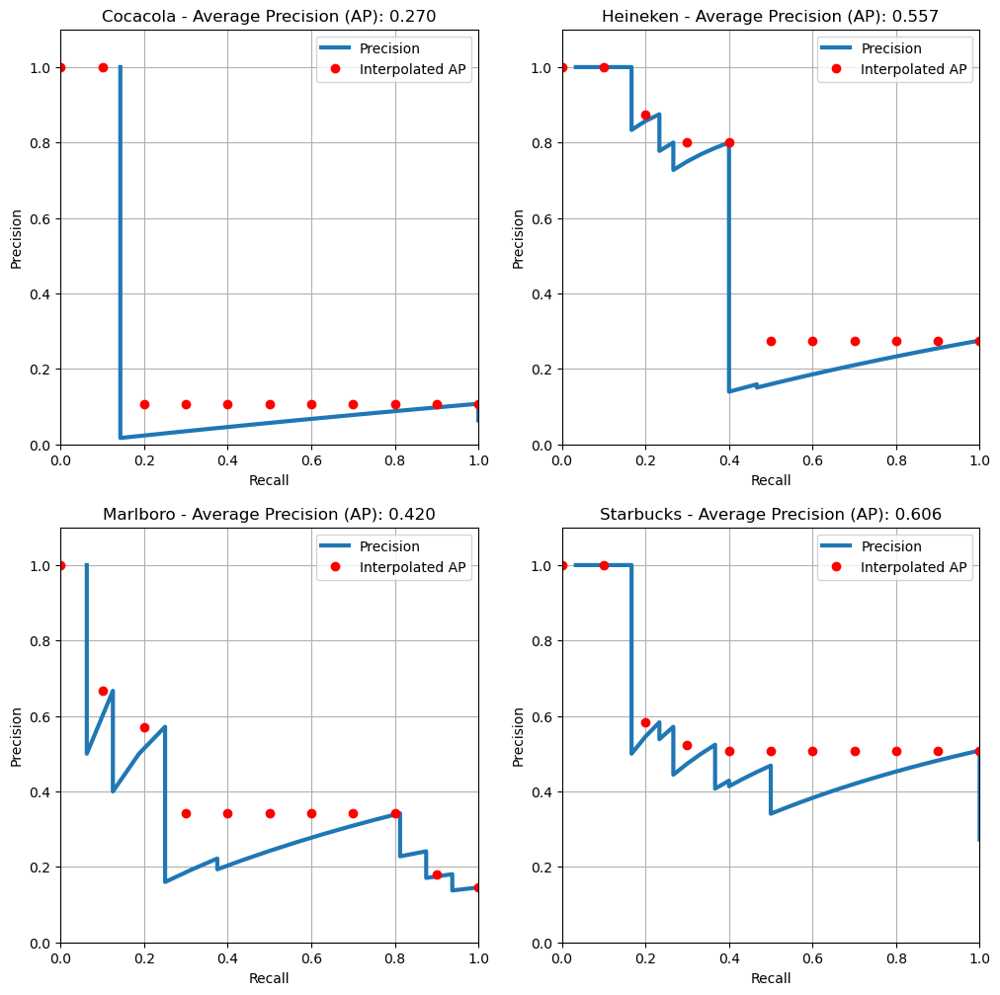

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.270
Heineken   ===>  0.557
Marlboro   ===>  0.420
Starbucks  ===>  0.606

Mean Average Precision (mAP) ===> 0.463
[0.26993007 0.55694329 0.41971857 0.60604226]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[  0.   0.   0.   0.   1.   0.   0.   1.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
 175.   4.   0.   0.   0.   0.   0.   2.   0.   0.   0.   2.   0.   0.
   0.   0.   0. 207.  46.   0.   1.   0.  90.   0.   0.   0.  11.   1.
   0.   0.   5.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   2.
   0.   0.   0.   0.   0.   

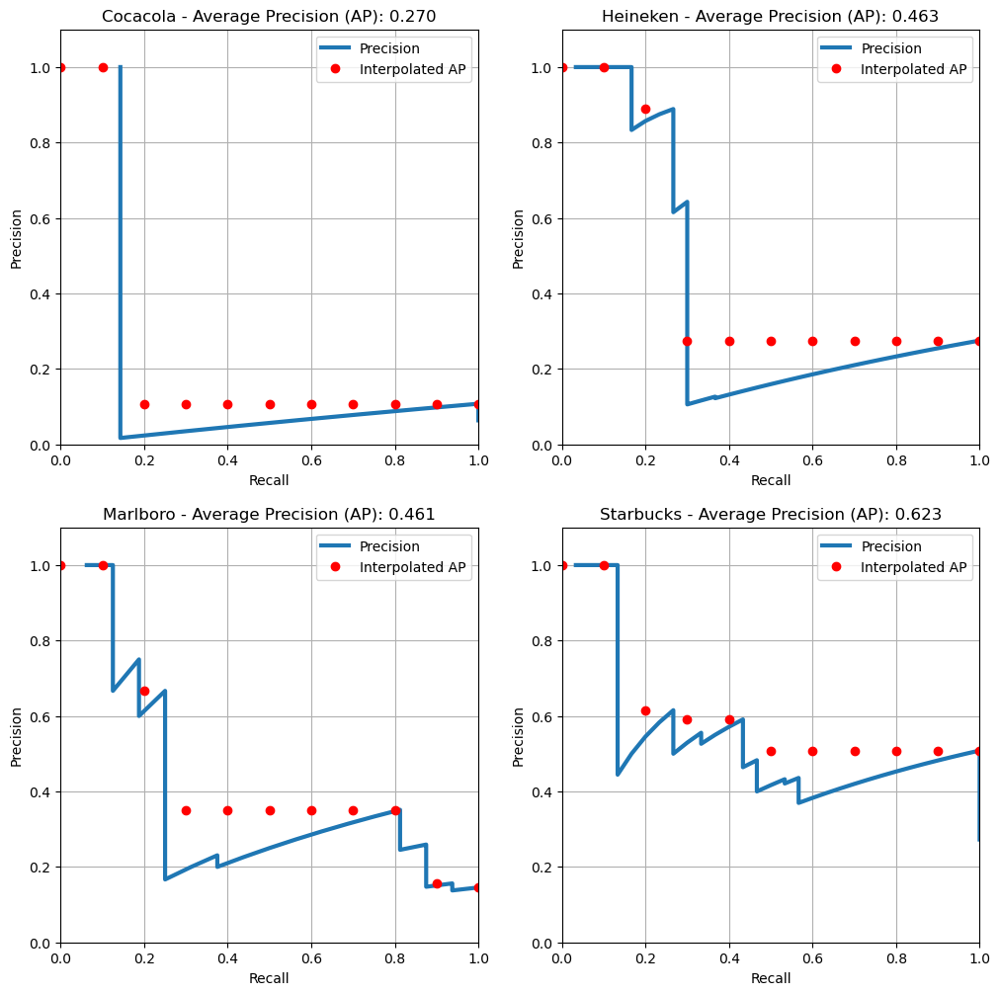

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.270
Heineken   ===>  0.463
Marlboro   ===>  0.461
Starbucks  ===>  0.623

Mean Average Precision (mAP) ===> 0.454
[0.26993007 0.46279307 0.46149812 0.62255002]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[  0.   0.   0.   0.   1.   0.   0.   2.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   1.   2.   0.
 159.   1.   0.   0.   0.   0.   0.   0.   0.   9.   0.   2.   0.   0.
   0.   0.   0. 177.  42.   1.   1.   0.  71.   0.   0.   0.   8.   0.
   0.   0.   5.   0.   0.   0.   0.   1.   0.   0.   0.   0.   0.   3.
   0.   1.   0.   0.   0.   

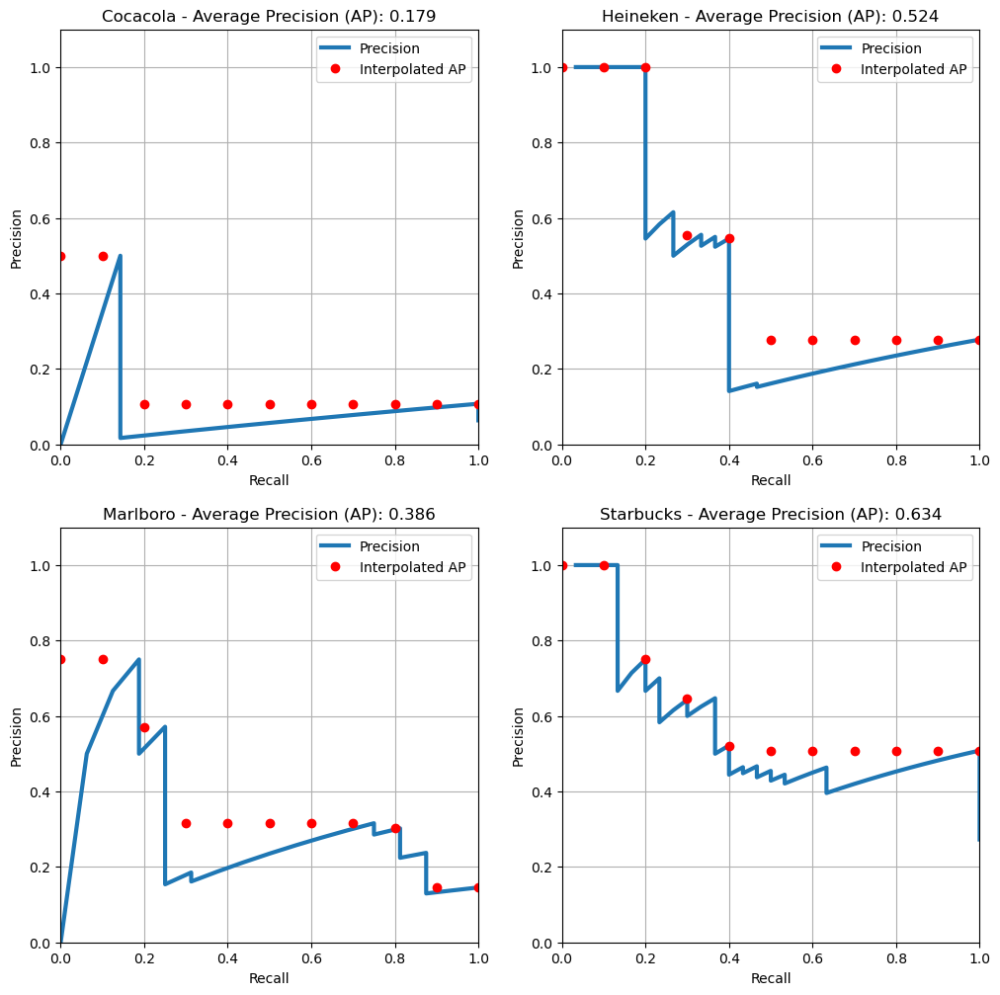

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.179
Heineken   ===>  0.524
Marlboro   ===>  0.386
Starbucks  ===>  0.634

Mean Average Precision (mAP) ===> 0.431
[0.17902098 0.52433425 0.38578278 0.63360413]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 48.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  2.  0.  0.  0.  0.  0. 91.  7.  0.  0.  0. 68.  0.  0.  0.
 17.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

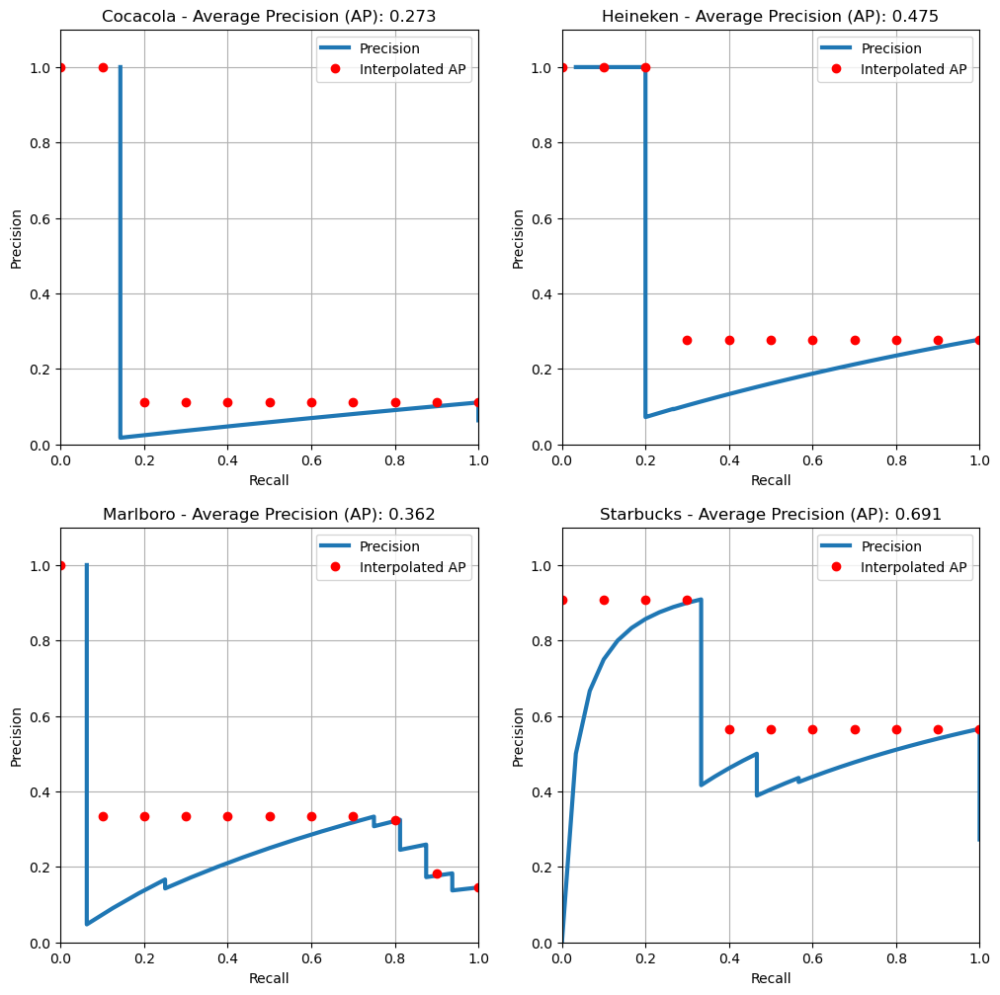

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.475
Marlboro   ===>  0.362
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.450
[0.27272727 0.47474747 0.36242861 0.69078434]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 46.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0. 66. 11.  0.  0.  0. 69.  0.  0.  0.
  4.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

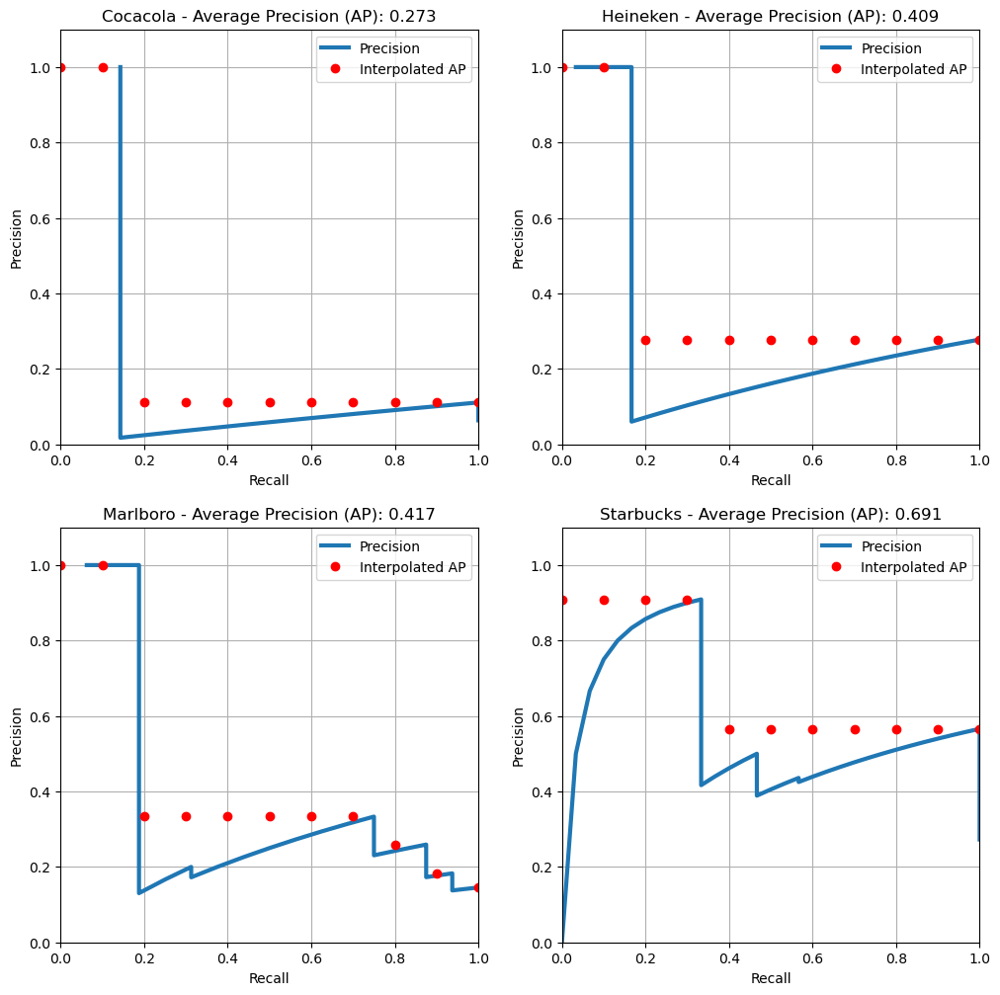

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.409
Marlboro   ===>  0.417
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.447
[0.27272727 0.40909091 0.41705824 0.69078434]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 3. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  3.  0.  0. 38.  3.  0.  0.  0.  0.  0.  0.
  0.  1.  0.  0.  0.  0.  0.  0.  0. 65.  9.  0.  0.  0. 67.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

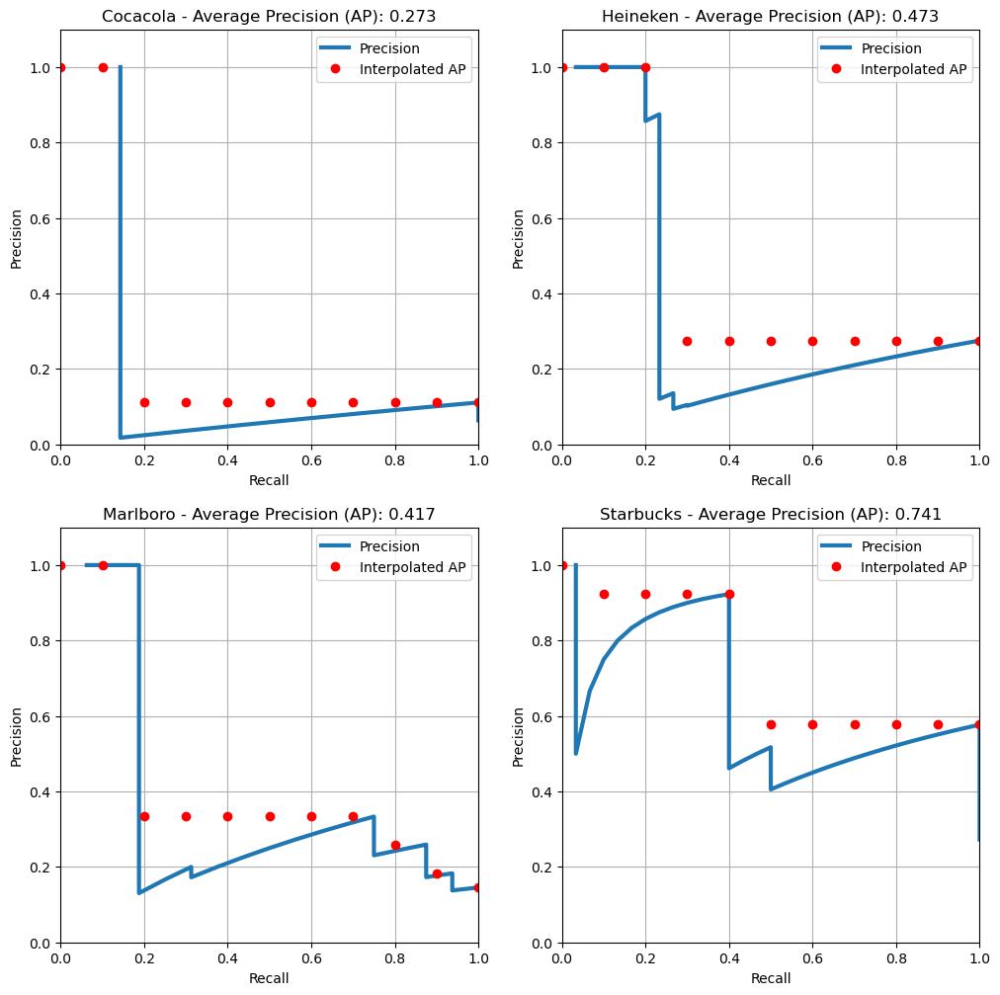

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.473
Marlboro   ===>  0.417
Starbucks  ===>  0.741

Mean Average Precision (mAP) ===> 0.476
[0.27272727 0.47289408 0.41705824 0.74125874]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 13.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.  1.  0.  0.  0. 81.  0.  0.  0.
 22.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

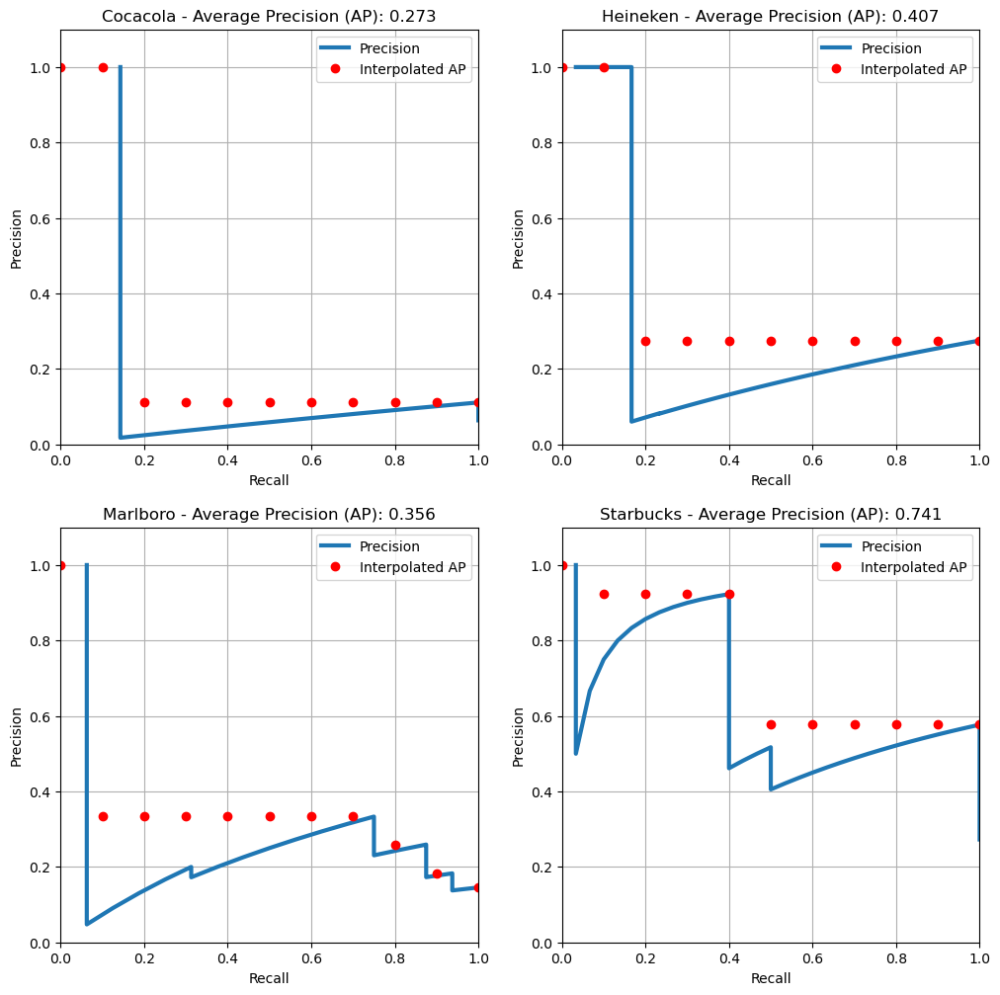

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.356
Starbucks  ===>  0.741

Mean Average Precision (mAP) ===> 0.444
[0.27272727 0.40700584 0.35645218 0.74125874]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 2. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0. 14.  0.  0.  0.  0.  0.  0.  0.
  0.  1.  0.  0.  0.  0.  0.  0.  0.  4.  0.  0.  0.  0. 46.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

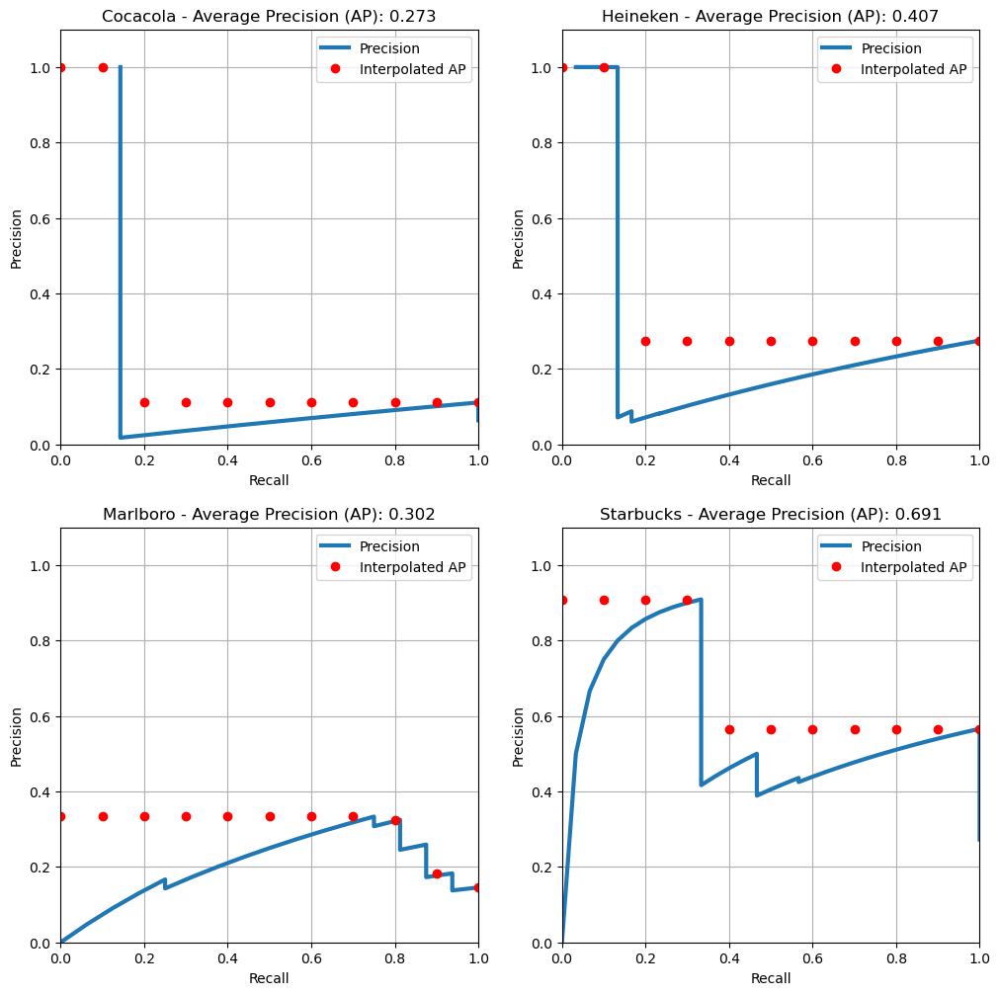

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.302
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.418
[0.27272727 0.40700584 0.30182255 0.69078434]
Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.  0.  0.  0.  0. 49.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  

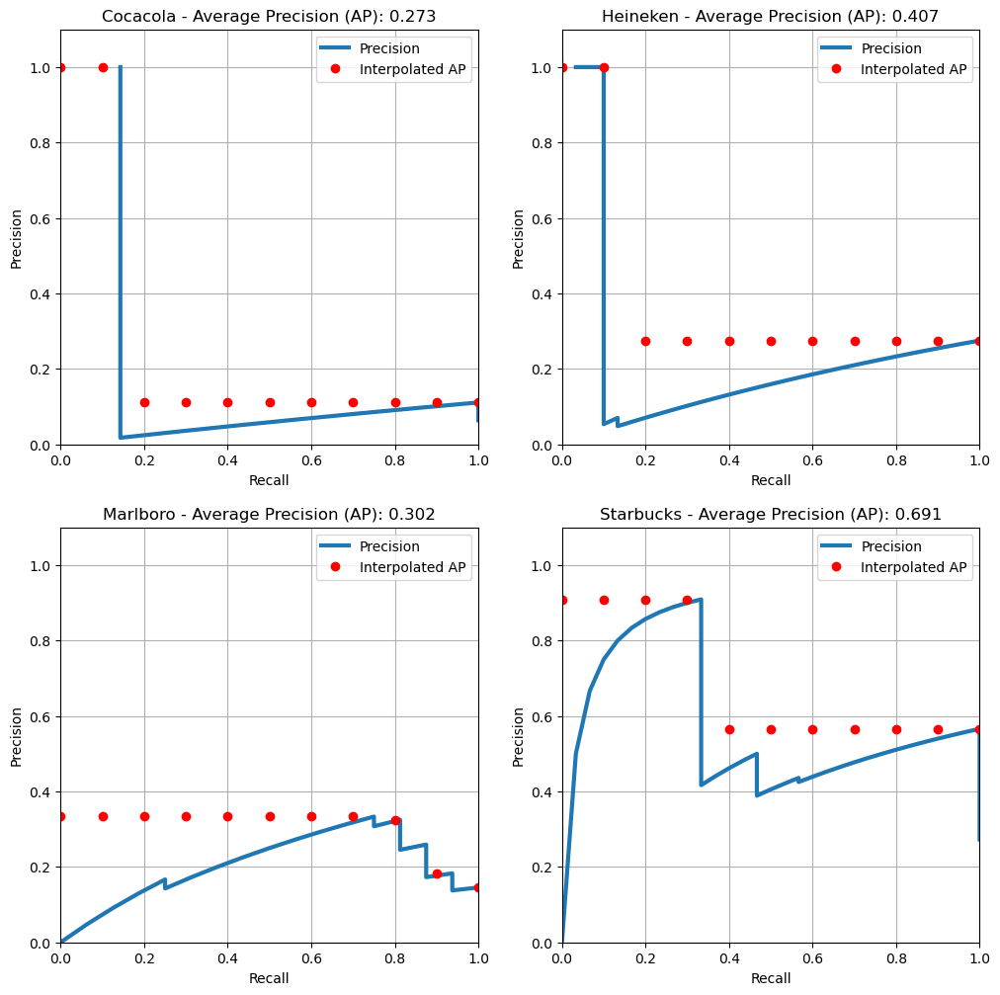

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.302
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.418
[0.27272727 0.40700584 0.30182255 0.69078434]
Best set of parameters: [5, 7, 0.06]
Best score: 0.4180850011109097


In [28]:
params = {
    "blockSize": [2, 3, 4, 5],  # Suggested: start with 2-3
    "ksize": [3, 5, 7],            # Suggested: start with 3
    "k": [0.02, 0.04, 0.06]#0.08, 0.1, 0.15]  # Suggested: start around 0.04-0.06
}

D = {}
for i in params['blockSize']:
    for j in params['ksize']:
        for k in params['k']:
            query_kps, query_des, db_kps, db_des = get_keypoints_harris(params = {'blockSize': i, 'ksize': j, 'k': k})
            logo_matches, num_matches = get_matches()
            AP = get_graphs(num_matches)

            D[np.mean(AP)] = [i, j, k]
            
# Now retrieving the maximum from the dictionary, it corresponds to the best set of parameters
best_params = max(D, key=D.get)

print(f'Best set of parameters: {D[best_params]}')
print(f'Best score: {best_params}')

The best result is obtained for 
```python
Best set of parameters: [5, 7, 0.06]
Best score: 0.42
```

Where best score is related to the maximum value of the mean AP computer on all the four logos for each run.

We can then run again the code with the best combination of the parameters that have been obtained:

Number of matches (Cocacola):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Number of matches (Heineken):
[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  9.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  8.  0.  0.  0.  0. 49.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.]
Number of matches (Marlboro):
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0

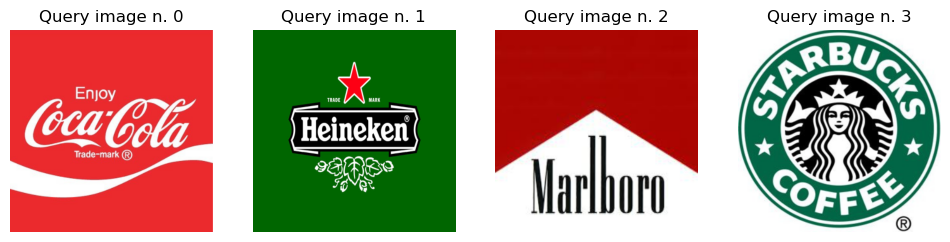

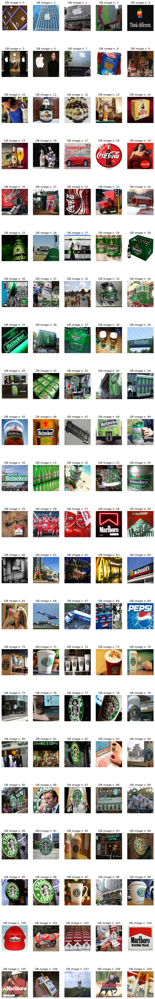

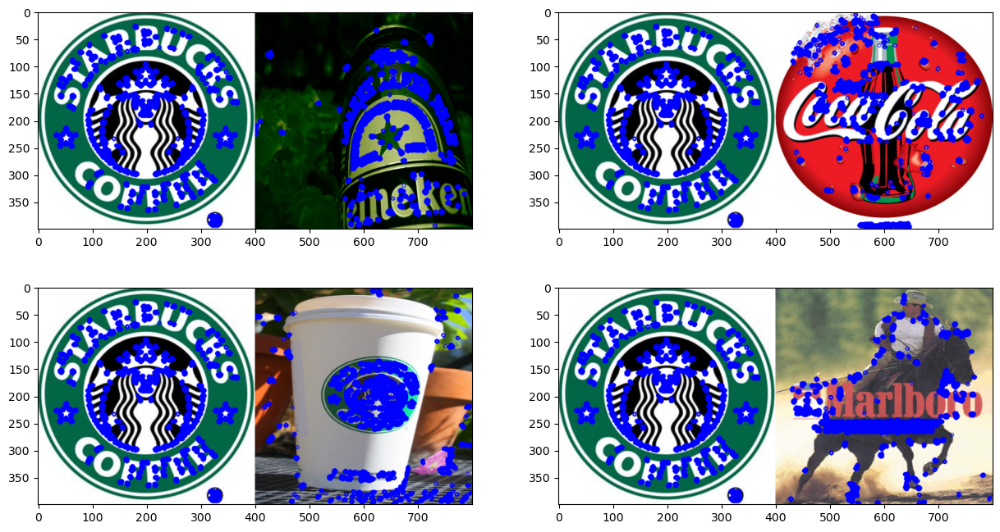

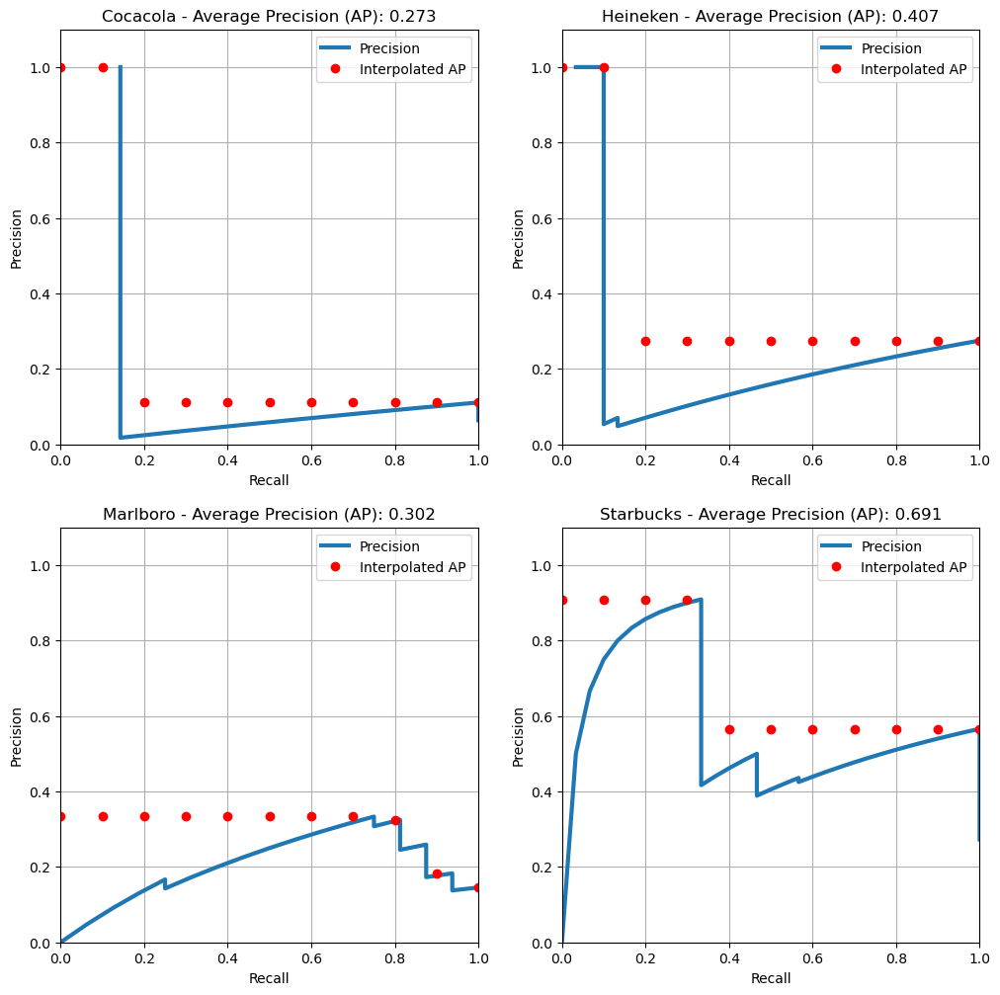

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.273
Heineken   ===>  0.407
Marlboro   ===>  0.302
Starbucks  ===>  0.691

Mean Average Precision (mAP) ===> 0.418


array([0.27272727, 0.40700584, 0.30182255, 0.69078434])

In [13]:
best_params = {'blockSize': 5, 'ksize': 7, 'k': 0.06}

query_kps, query_des, db_kps, db_des = get_keypoints_harris(params = best_params)
logo_matches, num_matches = get_matches()
draw_matches(query_kps, db_kps, logo_matches)
get_graphs(num_matches)

Unfortunately, the result is not as good as the one obtained with the SIFT detector.

# Keypoints matching

It would be interesting also to try a different matcher associated to the `SIFT` detector instead of the `cv2.BFMatcher_create()`.

The brute force one appears to be a good choice when dealing with small datasets or low dimensional descriptors.

`cv2.FlannBasedMatcher` is more efficient than the brute-force method, particularly when dealing with large datasets or high-dimensional features. 
In particular **FLANN** stands for **F**ast **L**ibrary for **A**pproximate **N**earest **N**eighbors. It uses the Nearest Neighbors approach in order to classify the data.

In [24]:
def get_matches_noBF(ratio_thresh = 0.66, flag = 1):
  '''
  This function should implement the cv2.FlannBasedMatcher(index_params, search params)

  - index params = dict(algorithm = 1, trees = 5)
  Specifies that the algorithm is used for SIFT descriptors 
  trees = 5 specifies the number of trees to construct the KD-tree.

  - search_params = dict(checks = 50)
  Number of times the search is performed in the KD-tree. 
  
  '''

  index_params = dict(algorithm = 1,
                      trees = 5)
  search_params = dict(checks = 50)
    
  #Flann matcher
  flann = cv2.FlannBasedMatcher(index_params, search_params)

  # Matrix containing the number of matches per logo
  num_matches = np.zeros((len(query_images), len(db_images)))

  # Filter matches using the Lowe's ratio test
  # ratio_thresh = 0.66

  # Save  matches for each descriptor of query images
  logo_matches = [] # List of lists

  # For each query image
  for q in range(len(query_images)):
    q_matches = []
    # For each database image
    for db in range(len(db_images)):
      matches = flann.knnMatch(query_des[q], db_des[db], k=2)
      # Apply ratio test
      n_matches = 0
      sel_matches = []
      for m,n in matches:
        if m.distance < ratio_thresh * n.distance:
          n_matches += 1
          sel_matches.append(m)
      # Save number of matches
      num_matches[q, db] = n_matches
      # Save matches
      q_matches.append(sel_matches)
    logo_matches.append(q_matches)

  for idx, logo in enumerate(logo_names):
    print("Number of matches (" + logo + "):")
    print(num_matches[idx])


  if flag == 1:
    return logo_matches, num_matches

Number of matches (Cocacola):
[ 6.  2.  0.  4.  1.  5.  2.  3.  9.  1.  2.  1.  5.  4.  3.  0.  1.  3.
 26. 32.  9.  2.  3.  5.  8.  4.  0.  2.  5.  1.  3.  1.  5.  0.  0.  2.
  2.  3.  0.  1.  7.  2.  2.  3.  3.  8.  5.  3.  4.  1.  3.  0.  1.  3.
  4.  1.  3.  5.  3.  1.  2.  3.  5.  0.  1.  1.  3.  6.  2.  3.  3.  1.
  0.  5.  2.  0.  3.  4.  1.  0.  4.  0.  2.  0.  2.  1.  2.  0.  2.  1.
  1.  5.  7.  5.  2.  4.  1.  2.  3.  5.  0.  2.  5.  3.  2.  3.  1.  3.
  4.  7.]
Number of matches (Heineken):
[  4.   0.   1.   1.   2.   0.   2.   2.   9.   0.   3.   1.   2.   0.
   0.   1.   0.   2.   0.   2.   0.   0.   1.   2.   9.  27.  19.   4.
 119.  32.   5.  29.   0.  19.   1.  26.   4.  30.  10.  24.   6.  15.
  14.   0.   0.  53.  42.   6.  66.  27.  48.   1.  12.  57.  26.   1.
   4.   1.   9.   3.   1.   4.   8.   3.   1.   0.   0.   0.   2.   2.
   2.   1.   1.   0.   2.   0.   0.   0.   4.   1.   0.   0.   0.   0.
   1.   1.   0.   0.   1.   0.   1.   0.   0.   0.   0.   2.   0. 

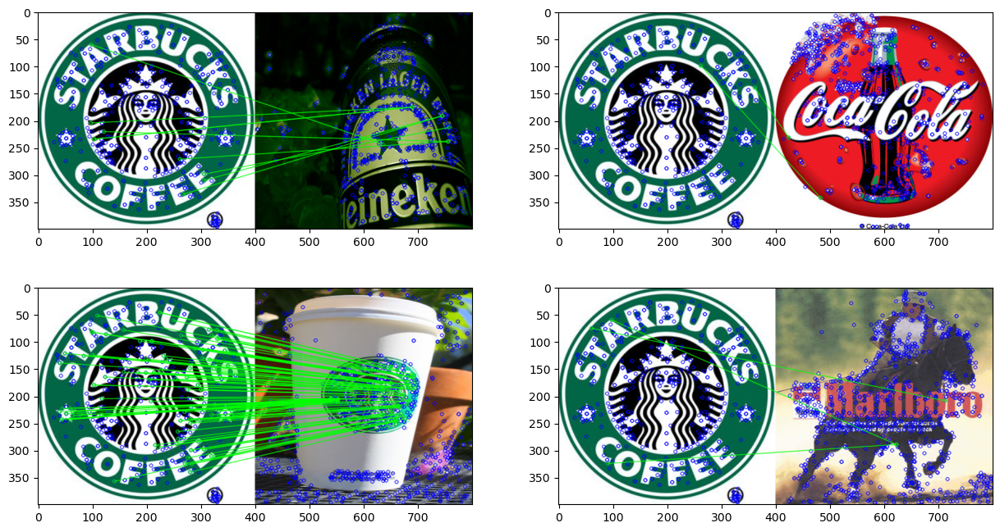

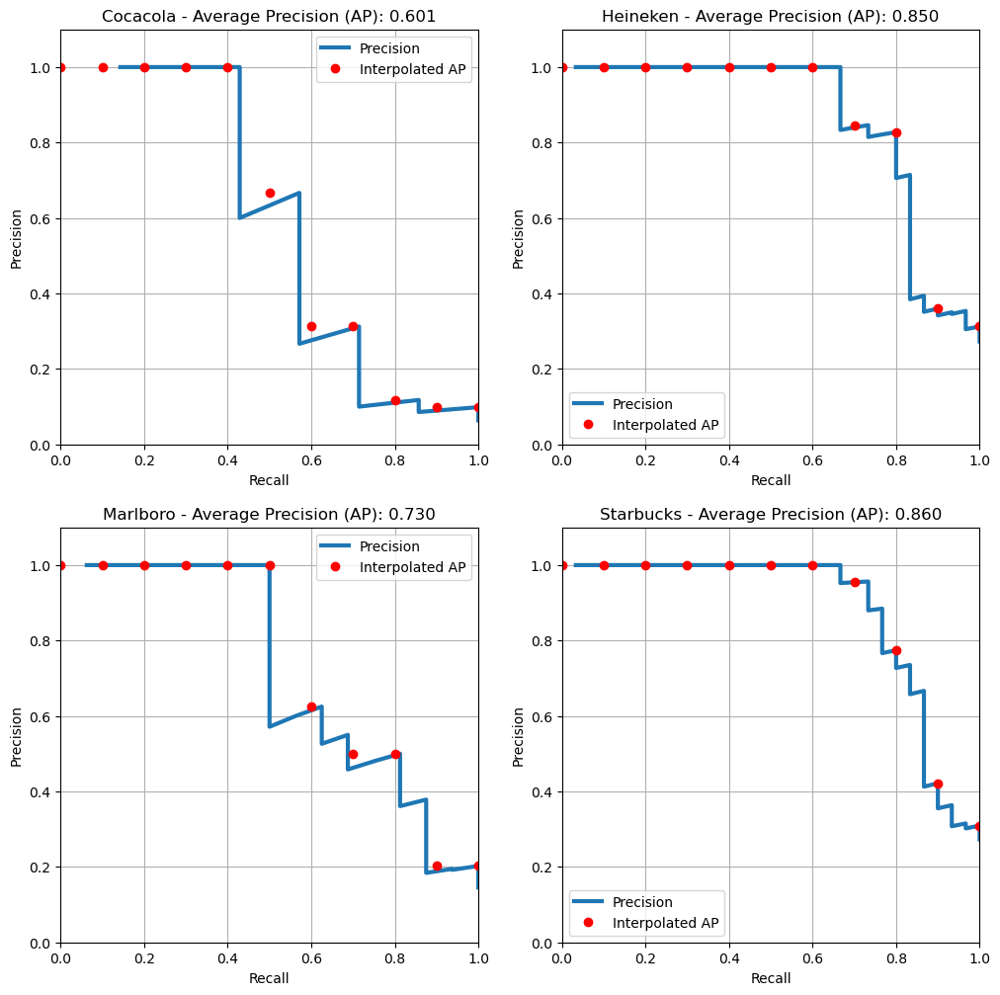

BASELINE RESULTS
Average Precision (AP):

Cocacola   ===>  0.601
Heineken   ===>  0.850
Marlboro   ===>  0.730
Starbucks  ===>  0.860

Mean Average Precision (mAP) ===> 0.760


array([0.60059062, 0.84965819, 0.73000575, 0.86016988])

In [27]:
query_kps, query_des, db_kps, db_des = get_keypoints()
logo_matches, num_matches = get_matches_noBF()
draw_matches(query_kps, db_kps, logo_matches)
get_graphs(num_matches)

Since the results are quiet good, we decided to not perform any tuning parameter for this case.